In [1]:
# import necessary modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
import statsmodels.api as sm
import itertools

In [2]:
# reading dataset
data=pd.read_csv('train.csv')

In [3]:
data

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10
...,...,...,...,...
912995,2017-12-27,10,50,63
912996,2017-12-28,10,50,59
912997,2017-12-29,10,50,74
912998,2017-12-30,10,50,62


In [4]:
data_test=pd.read_csv('test.csv')

In [5]:
data_test

,id,date,store,item
0,0,2018-01-01,1,1
1,1,2018-01-02,1,1
2,2,2018-01-03,1,1
3,3,2018-01-04,1,1
4,4,2018-01-05,1,1
...,...,...,...,...
44995,44995,2018-03-27,10,50
44996,44996,2018-03-28,10,50
44997,44997,2018-03-29,10,50
44998,44998,2018-03-30,10,50


### Basic information

In [6]:
# checking number of rows and columns 
data.shape

(913000, 4)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   date    913000 non-null  object
 1   store   913000 non-null  int64 
 2   item    913000 non-null  int64 
 3   sales   913000 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 27.9+ MB


In [8]:
data.describe()

,store,item,sales
count,913000.000000,913000.000000,913000.000000
mean,5.500000,25.500000,52.250287
std,2.872283,14.430878,28.801144
min,1.000000,1.000000,0.000000
25%,3.000000,13.000000,30.000000
50%,5.500000,25.500000,47.000000
75%,8.000000,38.000000,70.000000
max,10.000000,50.000000,231.000000


In [9]:
data.isna().sum()

date     0
store    0
item     0
sales    0
dtype: int64

In [10]:
data.duplicated().sum()

0

In [11]:
data['store'].nunique()

10

In [12]:
data['item'].nunique()

50

In [13]:
data['sales'].nunique()

213

### Statistical table of sale(stores-wise)

In [14]:
data.groupby(["store"]).agg({"sales": ["count","sum", "mean", "median", "std", "min", "max"]})

sales                                               
       count      sum       mean median        std min  max
store                                                      
1      91300  4315603  47.268379   44.0  24.006252   1  155
2      91300  6120128  67.033165   62.0  33.595810   3  231
3      91300  5435144  59.530602   55.0  29.974102   3  196
4      91300  5012639  54.902946   51.0  27.733097   4  186
5      91300  3631016  39.770164   37.0  20.365757   2  130
6      91300  3627670  39.733516   37.0  20.310451   0  134
7      91300  3320009  36.363735   34.0  18.684825   1  122
8      91300  5856169  64.142048   60.0  32.231751   4  204
9      91300  5025976  55.049025   51.0  27.832186   4  195
10     91300  5360158  58.709288   54.0  29.554994   3  187

In [15]:
data.groupby(["store", "item"]).agg({"sales": ["sum"]})     # Total sales in store and product breakdown

sales
               sum
store item        
1     1      36468
      2      97050
      3      60638
      4      36440
      5      30335
...            ...
10    46    120601
      47     45204
      48    105570
      49     60317
      50    135192

[500 rows x 1 columns]

<AxesSubplot: xlabel='store', ylabel='count'>

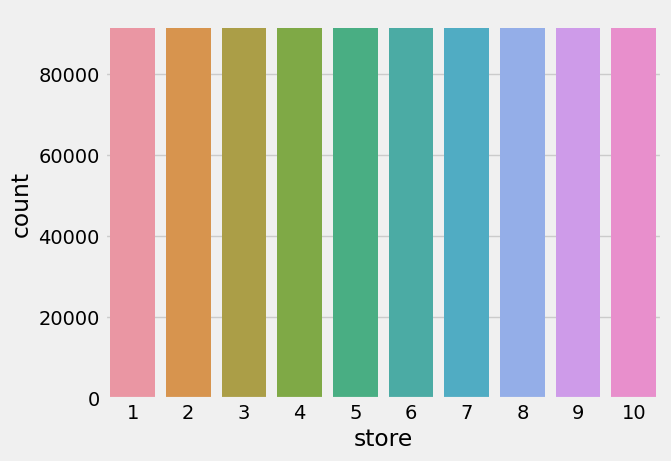

In [16]:
sns.countplot(x ='store', data = data)

In [17]:
data['sales'].min()

0

In [18]:
data['sales'].max()

231

In [19]:
data['date']=pd.to_datetime(data['date'])
data

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10
...,...,...,...,...
912995,2017-12-27,10,50,63
912996,2017-12-28,10,50,59
912997,2017-12-29,10,50,74
912998,2017-12-30,10,50,62


In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    913000 non-null  datetime64[ns]
 1   store   913000 non-null  int64         
 2   item    913000 non-null  int64         
 3   sales   913000 non-null  int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 27.9 MB


In [21]:
product1= data.loc[data['item'] == 1]
product1

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10
...,...,...,...,...
18255,2017-12-27,10,1,19
18256,2017-12-28,10,1,12
18257,2017-12-29,10,1,23
18258,2017-12-30,10,1,26


In [22]:
#Now let's sort product1 datframe according to order date
product1 = product1.sort_values('date')


In [23]:
product1 = product1.set_index('date')

In [24]:
product1

,store,item,sales
date,,,
2013-01-01,1,1,13
2013-01-01,6,1,20
2013-01-01,4,1,10
2013-01-01,7,1,7
2013-01-01,3,1,19
...,...,...,...
2017-12-31,3,1,19
2017-12-31,2,1,31
2017-12-31,1,1,23


### Store-wise sales plot

In [25]:
#Now let's find how much total  sales occurred on each date in different stores
store_wise_sales = data.groupby('store')['sales'].sum()
store_wise_sales

store
1     4315603
2     6120128
3     5435144
4     5012639
5     3631016
6     3627670
7     3320009
8     5856169
9     5025976
10    5360158
Name: sales, dtype: int64

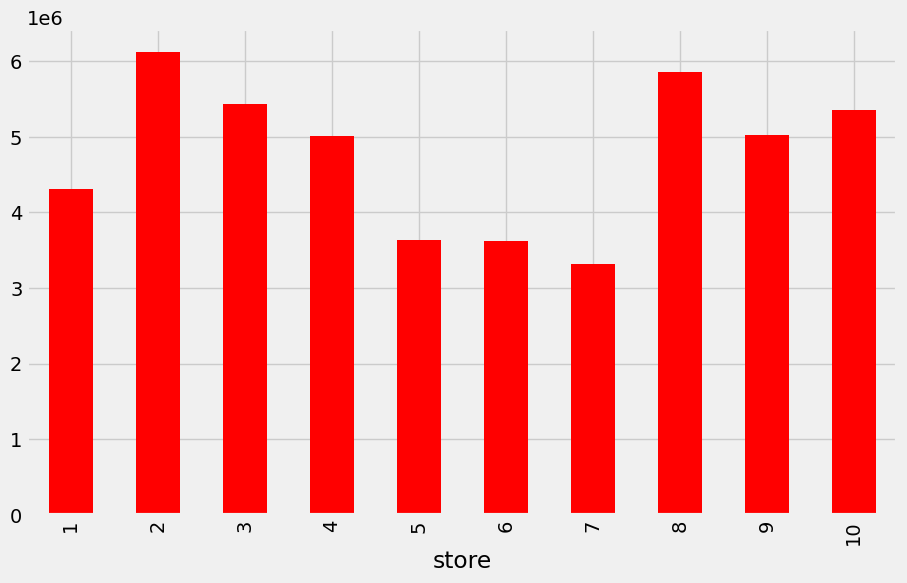

In [26]:
store_wise_sales.plot(figsize=(10,6),kind='bar',color = "red")
plt.show()

### Item-wise sales plot

In [27]:
#Now let's find how much total  sales occurred on each date in different stores
item_wise_sales = data.groupby('item')['sales'].sum()
item_wise_sales

item
1      401384
2     1069564
3      669087
4      401907
5      335230
6     1068281
7     1068777
8     1405108
9      938379
10    1337133
11    1271925
12    1271534
13    1539621
14    1071531
15    1607442
16     468480
17     602486
18    1538876
19     736892
20     867641
21     736190
22    1469971
23     534979
24    1205975
25    1473334
26     869981
27     402628
28    1604713
29    1271240
30     736554
31    1070845
32     803107
33    1270183
34     469935
35    1201541
36    1406548
37     534258
38    1470330
39     801311
40     534094
41     401759
42     669925
43     936635
44     536811
45    1471467
46    1070764
47     401781
48     937703
49     535663
50    1203009
Name: sales, dtype: int64

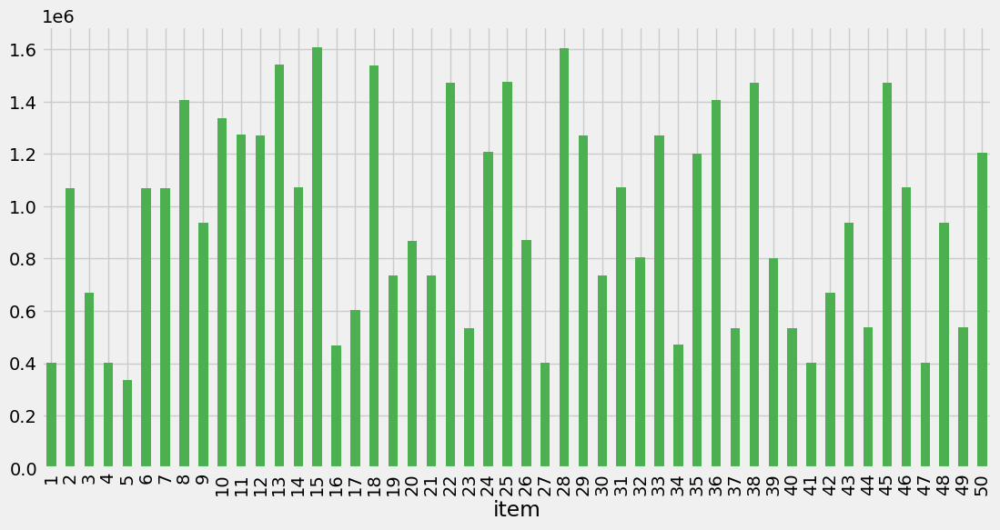

In [28]:
item_wise_sales.plot(figsize=(12,6),kind='bar',color = "#4CAF50")
plt.show()

In [29]:
df=pd.DataFrame({'Item':item_wise_sales.index, 'Sales':item_wise_sales.values})
sorted_df=df.sort_values(by='Sales',ascending=False)
sorted_df.set_index('Item')

,Sales
Item,
15,1607442
28,1604713
13,1539621
18,1538876
25,1473334
45,1471467
38,1470330
22,1469971
36,1406548


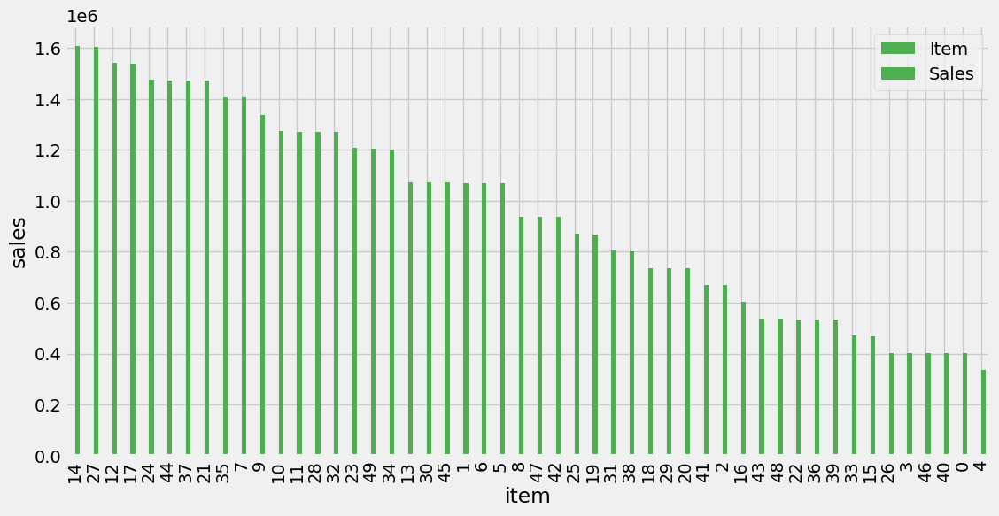

In [30]:
sorted_df.plot(figsize=(12,6),kind='bar',color = "#4CAF50")
plt.xlabel("item")

plt.ylabel("sales")
plt.show()

In [31]:
Total= data.groupby('date')['sales'].sum().reset_index()
Total = Total.set_index('date')
Total

,sales
date,
2013-01-01,13696
2013-01-02,13678
2013-01-03,14488
2013-01-04,15677
2013-01-05,16237
...,...
2017-12-27,20378
2017-12-28,21885
2017-12-29,23535


for i in data['store'].unique():
    store_value=data[data['store']==i]
    plt.figure(figsize=(15,10))
    heatmap_sales=pd.pivot_table(data=store_value,values='sales', index ='year',columns =['month'],aggfunc = np.sum)
    sns.heatmap(heatmap_sales,annot=True,fmt='g',cmap ='RdYlGn')
    plt.show()

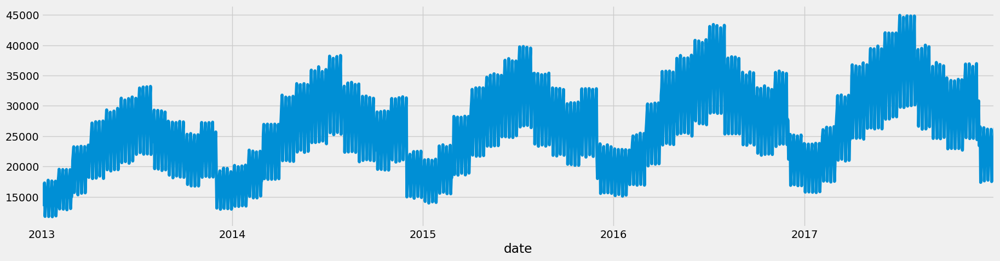

In [32]:
Total.sales.plot(figsize=(20,5))
plt.show()

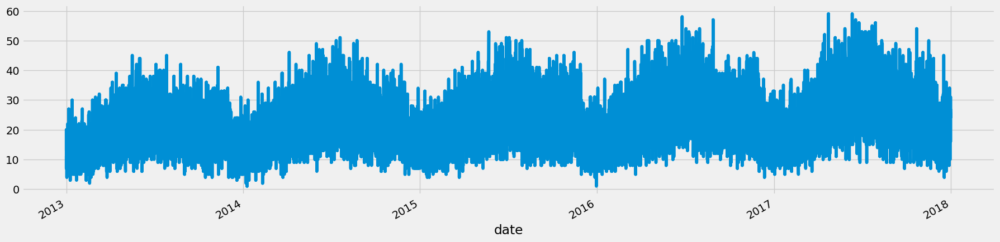

In [33]:
product1.sales.plot(figsize=(20,5))
plt.show()

In [34]:
product2= data.loc[data['item'] == 2]
product2

,date,store,item,sales
18260,2013-01-01,1,2,33
18261,2013-01-02,1,2,43
18262,2013-01-03,1,2,23
18263,2013-01-04,1,2,18
18264,2013-01-05,1,2,34
...,...,...,...,...
36515,2017-12-27,10,2,43
36516,2017-12-28,10,2,35
36517,2017-12-29,10,2,53
36518,2017-12-30,10,2,56


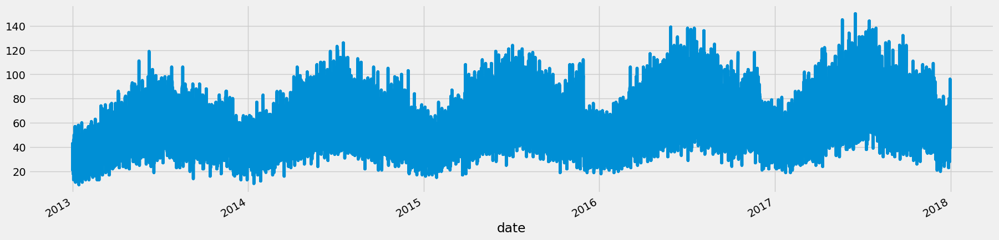

In [35]:
#Now let's sort product2 datframe according to order date
product2 = product2.sort_values('date')
product2 = product2.set_index('date')
product2.sales.plot(figsize=(20,5))
plt.show()

### Store wise analysis

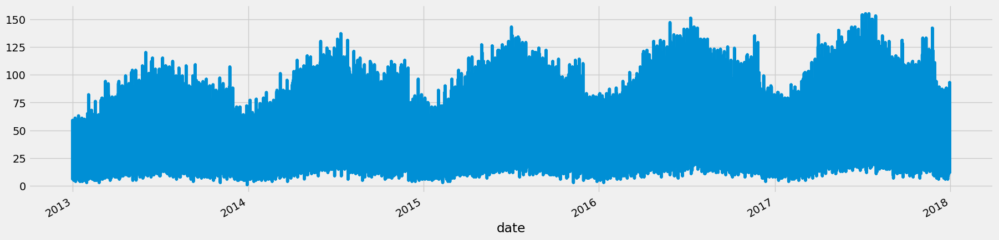

In [36]:
store1= data.loc[data['store'] == 1]
store1= store1.sort_values('date')
store1= store1.set_index('date')
store1.sales.plot(figsize=(20,5))
plt.show()

In [37]:
#Now let's find how much total  sales occurred in store 1 on each date
store1 = store1.groupby('date')['sales'].sum().reset_index()
store1

,date,sales
0,2013-01-01,1316
1,2013-01-02,1264
2,2013-01-03,1305
3,2013-01-04,1452
4,2013-01-05,1499
...,...,...
1821,2017-12-27,1837
1822,2017-12-28,1951
1823,2017-12-29,2116
1824,2017-12-30,2304


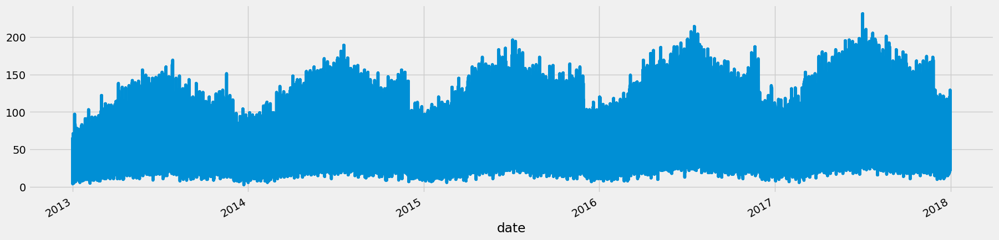

In [38]:
store2= data.loc[data['store'] == 2]
store2= store2.sort_values('date')
store2= store2.set_index('date')
store2.sales.plot(figsize=(20,5))
plt.show()

In [39]:
#Now let's find how much total  sales occurred in store 2 on each date
store2 = store2.groupby('date')['sales'].sum().reset_index()
store2

,date,sales
0,2013-01-01,1742
1,2013-01-02,1808
2,2013-01-03,1887
3,2013-01-04,1983
4,2013-01-05,2087
...,...,...
1821,2017-12-27,2624
1822,2017-12-28,2839
1823,2017-12-29,3025
1824,2017-12-30,3151


In [40]:
#Now let's set the Order date column as the index column
store2 = store2.set_index('date')
store2

,sales
date,
2013-01-01,1742
2013-01-02,1808
2013-01-03,1887
2013-01-04,1983
2013-01-05,2087
...,...
2017-12-27,2624
2017-12-28,2839
2017-12-29,3025


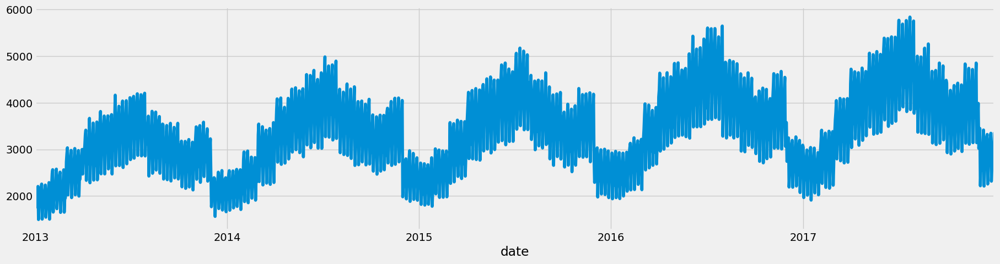

In [41]:
store2.sales.plot(figsize=(20,5))
plt.show()

In [42]:
#Now let's resample the data into means of monthly sales of furniture and save this into a new variable called Order date
store2_m = store2['sales'].resample('MS').mean()
store2_m

date
2013-01-01    1887.741935
2013-02-01    2120.857143
2013-03-01    2568.032258
2013-04-01    2932.900000
2013-05-01    3172.935484
2013-06-01    3405.266667
2013-07-01    3536.935484
2013-08-01    3161.032258
2013-09-01    2955.766667
2013-10-01    2712.677419
2013-11-01    2962.466667
2013-12-01    2094.903226
2014-01-01    2171.451613
2014-02-01    2414.464286
2014-03-01    2920.870968
2014-04-01    3382.133333
2014-05-01    3653.838710
2014-06-01    3883.000000
2014-07-01    4097.548387
2014-08-01    3652.129032
2014-09-01    3344.666667
2014-10-01    3152.677419
2014-11-01    3426.833333
2014-12-01    2386.741935
2015-01-01    2286.419355
2015-02-01    2533.928571
2015-03-01    3000.129032
2015-04-01    3538.866667
2015-05-01    3831.612903
2015-06-01    3989.066667
2015-07-01    4284.096774
2015-08-01    3813.741935
2015-09-01    3514.100000
2015-10-01    3298.645161
2015-11-01    3532.833333
2015-12-01    2517.225806
2016-01-01    2496.516129
2016-02-01    2719.000000
2016-03

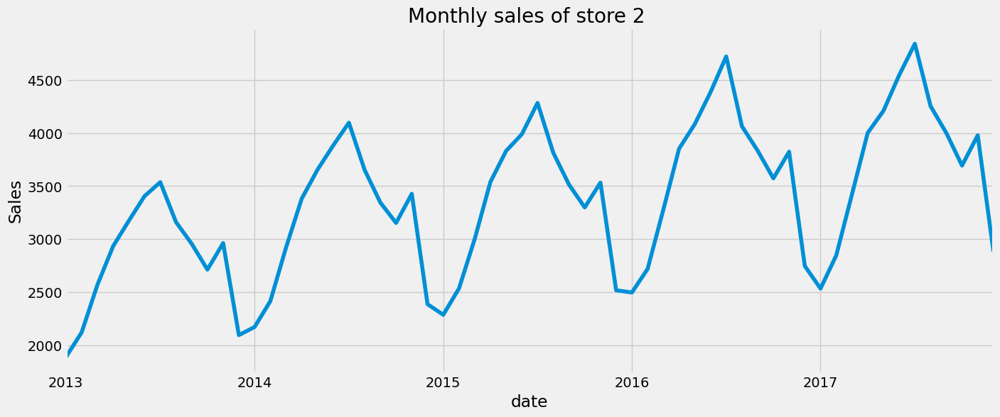

In [43]:
store2_m.plot(figsize=(15,6))
plt.title("Monthly sales of store 2 ")
plt.ylabel("Sales")
plt.show()

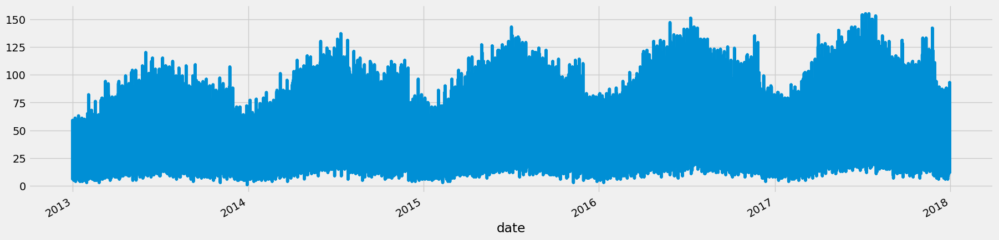

In [44]:
store1= data.loc[data['store'] == 1]
store1= store1.sort_values('date')
store1= store1.set_index('date')
store1.sales.plot(figsize=(20,5))
plt.show()

In [45]:
store1 = store1.groupby('date')['sales'].sum().reset_index()
store1

,date,sales
0,2013-01-01,1316
1,2013-01-02,1264
2,2013-01-03,1305
3,2013-01-04,1452
4,2013-01-05,1499
...,...,...
1821,2017-12-27,1837
1822,2017-12-28,1951
1823,2017-12-29,2116
1824,2017-12-30,2304


In [46]:
store1 = store1.set_index('date')
store1

,sales
date,
2013-01-01,1316
2013-01-02,1264
2013-01-03,1305
2013-01-04,1452
2013-01-05,1499
...,...
2017-12-27,1837
2017-12-28,1951
2017-12-29,2116


In [47]:
store1_m = store1['sales'].resample('MS').mean()
store1_m

date
2013-01-01    1325.064516
2013-02-01    1475.214286
2013-03-01    1800.870968
2013-04-01    2050.766667
2013-05-01    2234.580645
2013-06-01    2384.366667
2013-07-01    2500.870968
2013-08-01    2249.838710
2013-09-01    2080.266667
2013-10-01    1907.419355
2013-11-01    2082.166667
2013-12-01    1484.806452
2014-01-01    1541.548387
2014-02-01    1708.500000
2014-03-01    2055.774194
2014-04-01    2371.633333
2014-05-01    2584.129032
2014-06-01    2739.866667
2014-07-01    2883.516129
2014-08-01    2574.000000
2014-09-01    2371.133333
2014-10-01    2217.419355
2014-11-01    2416.866667
2014-12-01    1690.806452
2015-01-01    1607.806452
2015-02-01    1768.928571
2015-03-01    2130.838710
2015-04-01    2490.033333
2015-05-01    2694.290323
2015-06-01    2824.833333
2015-07-01    3031.258065
2015-08-01    2691.677419
2015-09-01    2479.633333
2015-10-01    2339.354839
2015-11-01    2476.400000
2015-12-01    1764.548387
2016-01-01    1759.967742
2016-02-01    1921.448276
2016-03

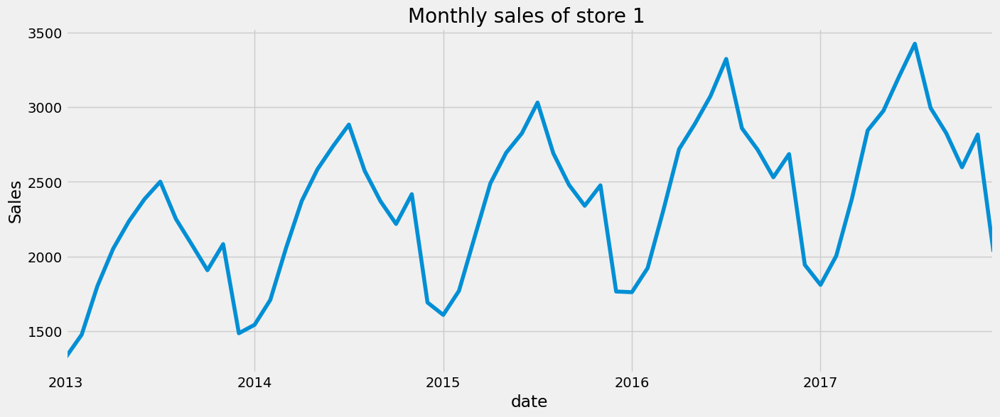

In [48]:
store1_m.plot(figsize=(15,6))
plt.title("Monthly sales of store 1 ")
plt.ylabel("Sales")
plt.show()

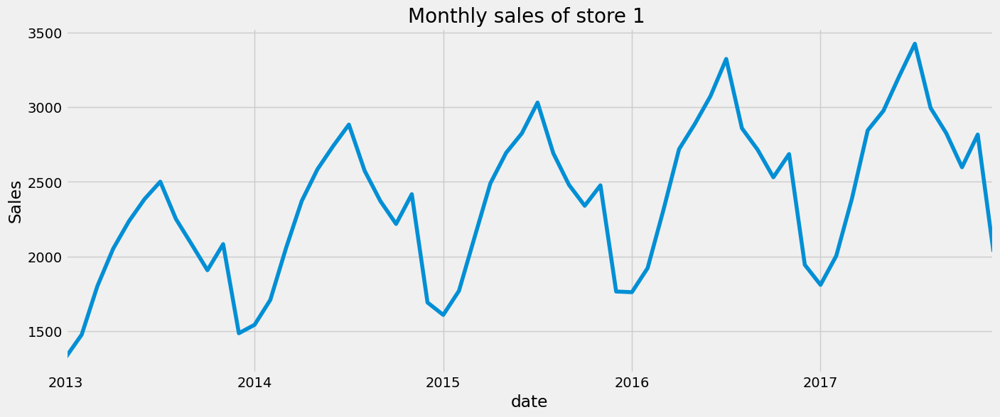

In [49]:
store1= data.loc[data['store'] == 1]
store1= store1.sort_values('date')
store1= store1.set_index('date')
store1 = store1.groupby('date')['sales'].sum().reset_index()
store1 = store1.set_index('date')
store1_m = store1['sales'].resample('MS').mean()
store1_m.plot(figsize=(15,6))
plt.title("Monthly sales of store 1 ")
plt.ylabel("Sales")
plt.show()

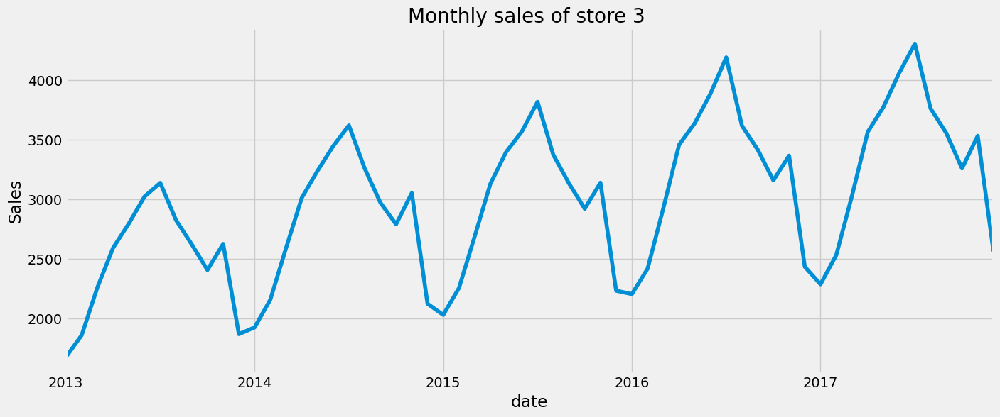

In [50]:
store3= data.loc[data['store'] == 3]
store3= store3.sort_values('date')
store3= store3.set_index('date')
store3 = store3.groupby('date')['sales'].sum().reset_index()
store3 = store3.set_index('date')
store3_m = store3['sales'].resample('MS').mean()
store3_m.plot(figsize=(15,6))
plt.title("Monthly sales of store 3 ")
plt.ylabel("Sales")
plt.show()

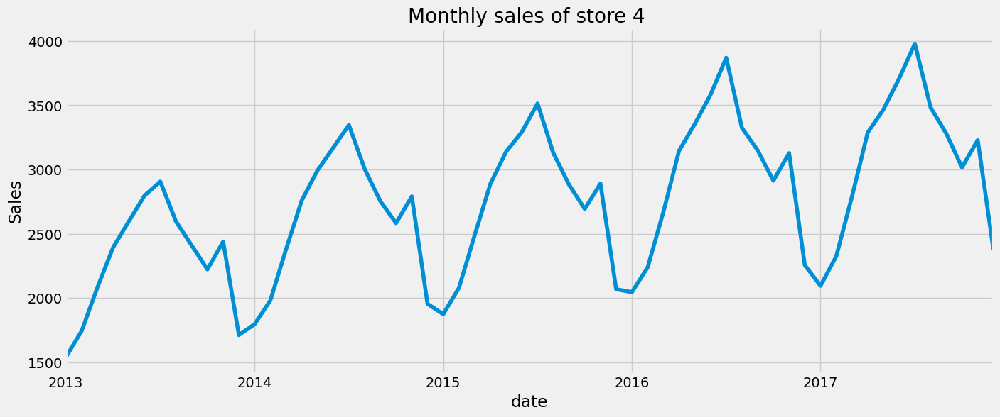

In [51]:
store4= data.loc[data['store'] == 4]
store4= store4.sort_values('date')
store4= store4.set_index('date')
store4 = store4.groupby('date')['sales'].sum().reset_index()
store4 = store4.set_index('date')
store4_m = store4['sales'].resample('MS').mean()
store4_m.plot(figsize=(15,6))
plt.title("Monthly sales of store 4 ")
plt.ylabel("Sales")
plt.show()

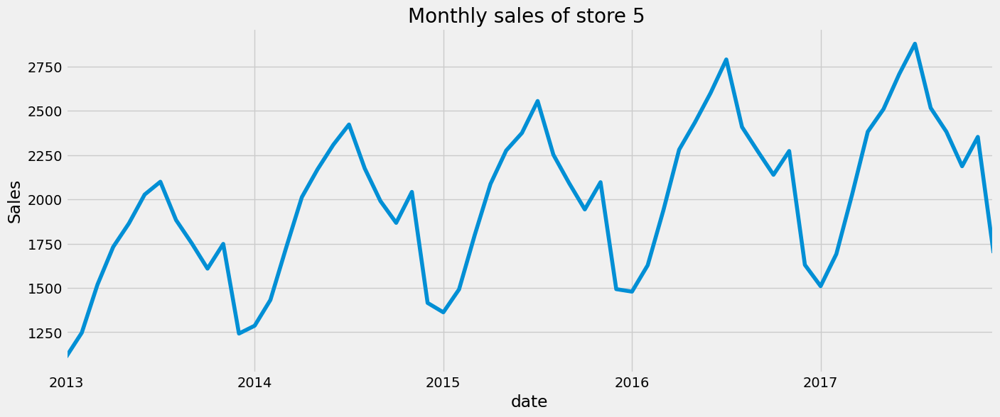

In [52]:
store5= data.loc[data['store'] == 5]
store5= store5.sort_values('date')
store5= store5.set_index('date')
store5 = store5.groupby('date')['sales'].sum().reset_index()
store5 = store5.set_index('date')
store5_m = store5['sales'].resample('MS').mean()
store5_m.plot(figsize=(15,6))
plt.title("Monthly sales of store 5 ")
plt.ylabel("Sales")
plt.show()

In [53]:
store1= data.loc[data['store'] == 1]
store1= store1.sort_values('date')
store1= store1.set_index('date')
store1 = store1.groupby('date')['sales'].sum().reset_index()
store1 = store1.set_index('date')
store1_m = store1['sales'].resample('MS').mean()

store2= data.loc[data['store'] == 2]
store2= store2.sort_values('date')
store2= store2.set_index('date')
store2 = store2.groupby('date')['sales'].sum().reset_index()
store2 = store2.set_index('date')
store2_m = store1['sales'].resample('MS').mean()

store3= data.loc[data['store'] == 3]
store3= store3.sort_values('date')
store3= store3.set_index('date')
store3 = store3.groupby('date')['sales'].sum().reset_index()
store3 = store3.set_index('date')
store3_m = store3['sales'].resample('MS').mean()

store4= data.loc[data['store'] == 4]
store4= store4.sort_values('date')
store4= store4.set_index('date')
store4 = store4.groupby('date')['sales'].sum().reset_index()
store4 = store4.set_index('date')
store4_m = store4['sales'].resample('MS').mean()


In [54]:
store5= data.loc[data['store'] == 5]
store5= store5.sort_values('date')
store5= store5.set_index('date')
store5 = store5.groupby('date')['sales'].sum().reset_index()
store5 = store5.set_index('date')
store5_m = store5['sales'].resample('MS').mean()


store6= data.loc[data['store'] == 6]
store6= store6.sort_values('date')
store6= store6.set_index('date')
store6 = store6.groupby('date')['sales'].sum().reset_index()
store6 = store6.set_index('date')
store6_m = store6['sales'].resample('MS').mean()


store7= data.loc[data['store'] == 7]
store7= store7.sort_values('date')
store7= store7.set_index('date')
store7 = store7.groupby('date')['sales'].sum().reset_index()
store7 = store7.set_index('date')
store7_m = store7['sales'].resample('MS').mean()


store8= data.loc[data['store'] == 8]
store8= store8.sort_values('date')
store8= store8.set_index('date')
store8 = store8.groupby('date')['sales'].sum().reset_index()
store8 = store8.set_index('date')
store8_m = store8['sales'].resample('MS').mean()

store9= data.loc[data['store'] == 9]
store9= store9.sort_values('date')
store9= store9.set_index('date')
store9 = store9.groupby('date')['sales'].sum().reset_index()
store9 = store9.set_index('date')
store9_m = store9['sales'].resample('MS').mean()

store10= data.loc[data['store'] == 10]
store10= store10.sort_values('date')
store10= store10.set_index('date')
store10 = store10.groupby('date')['sales'].sum().reset_index()
store10 = store10.set_index('date')
store10_m = store10['sales'].resample('MS').mean()





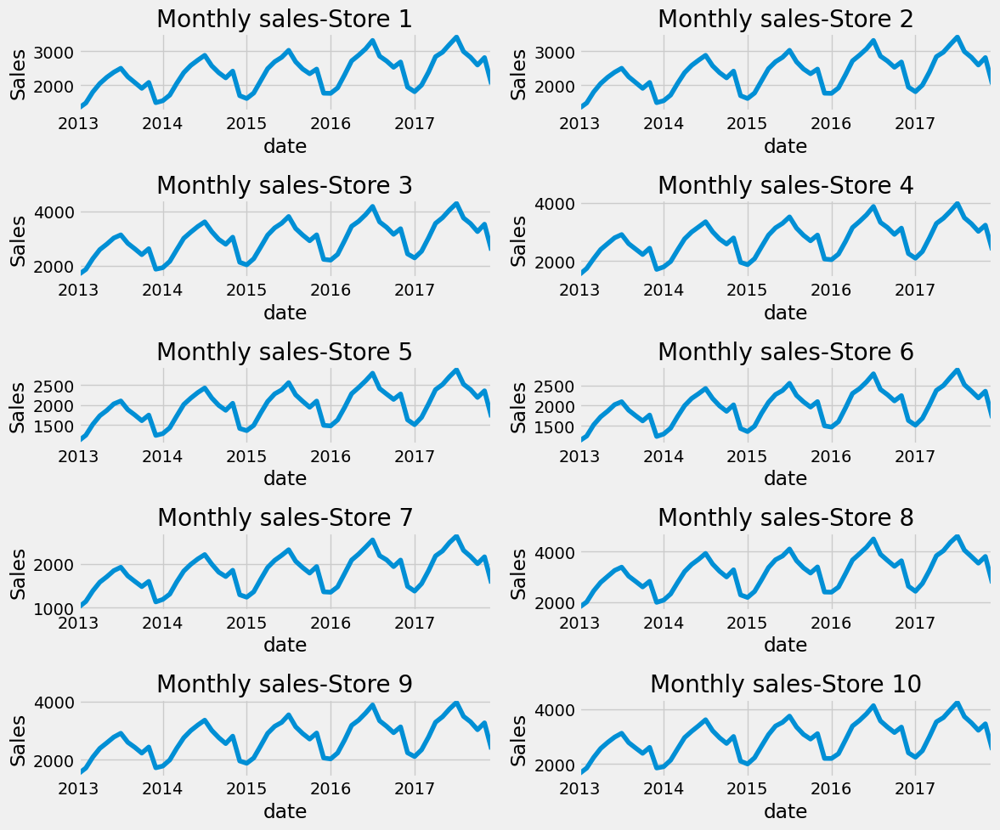

In [55]:
plt.figure(figsize=(12,10))
plt.subplot(5,2,1)
store1_m.plot()
plt.title("Monthly sales-Store 1")
plt.ylabel("Sales")
plt.subplot(5,2,2)
store2_m.plot()
plt.title("Monthly sales-Store 2")
plt.ylabel("Sales")
plt.subplot(5,2,3)
store3_m.plot()
plt.title("Monthly sales-Store 3")
plt.ylabel("Sales")
plt.subplot(5,2,4)
store4_m.plot()
plt.title("Monthly sales-Store 4")
plt.ylabel("Sales")
plt.subplot(5,2,5)
store5_m.plot()
plt.title("Monthly sales-Store 5")
plt.ylabel("Sales")
plt.subplot(5,2,6)
store6_m.plot()
plt.title("Monthly sales-Store 6")
plt.ylabel("Sales")

plt.subplot(5,2,7)
store7_m.plot()
plt.title("Monthly sales-Store 7")
plt.ylabel("Sales")

plt.subplot(5,2,8)
store8_m.plot()
plt.title("Monthly sales-Store 8")
plt.ylabel("Sales")

plt.subplot(5,2,9)
store9_m.plot()
plt.title("Monthly sales-Store 9")
plt.ylabel("Sales")

plt.subplot(5,2,10)
store10_m.plot()
plt.title("Monthly sales-Store 10")
plt.ylabel("Sales")
plt.tight_layout()

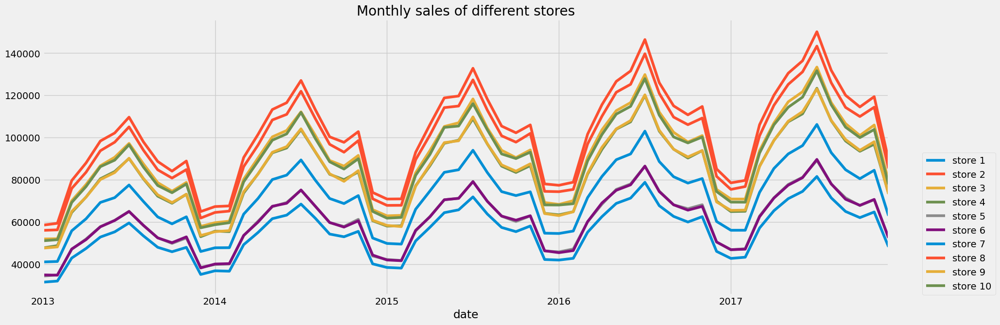

In [56]:
plt.title("Monthly sales of different stores")
for i in data['store'].unique():
    store_i = data.loc[data['store'] == i]
    store_i = store_i.groupby('date')['sales'].sum().reset_index()
    store_i = store_i.set_index('date')
    store_i = store_i['sales'].resample('M').sum()    #MS-month start
    store_i.plot(figsize=(20,7))
plt.legend(('store 1','store 2','store 3','store 4','store 5','store 6','store 7','store 8','store 9','store 10'),loc=(1.04, 0))   
    

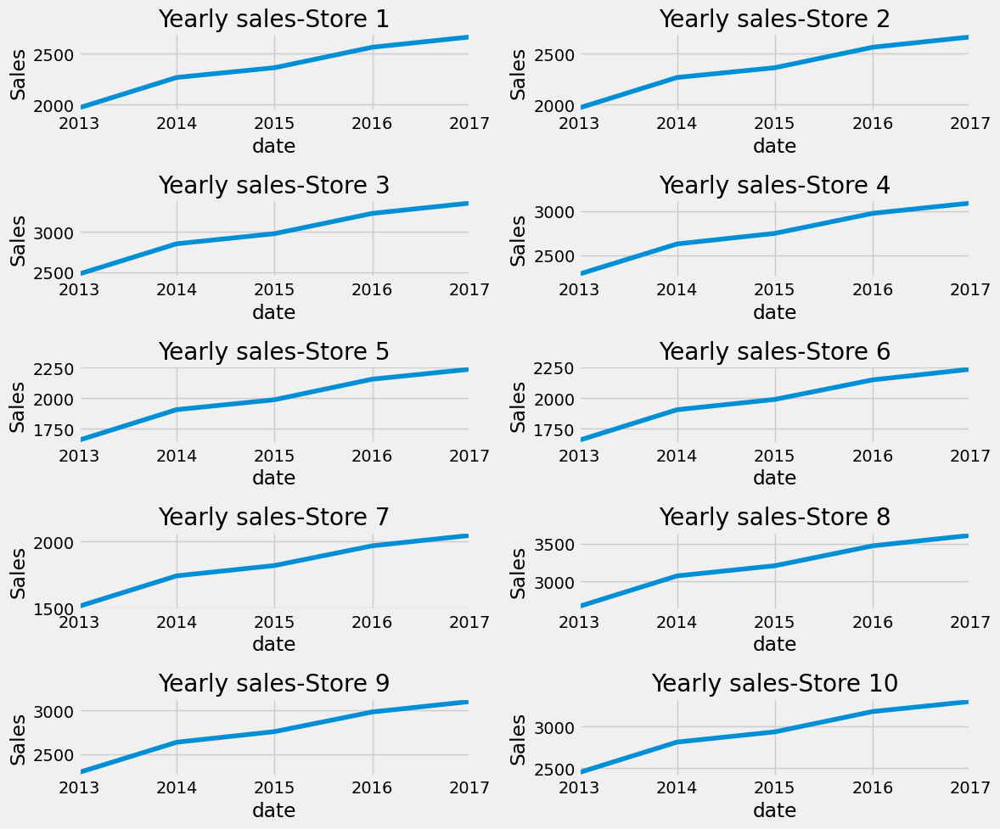

In [57]:
store1_y = store1['sales'].resample('Y').mean()

store2_y = store1['sales'].resample('Y').mean()

store3_y = store3['sales'].resample('Y').mean()

store4_y = store4['sales'].resample('Y').mean()

store5_y = store5['sales'].resample('Y').mean()

store6_y = store6['sales'].resample('Y').mean()

store7_y = store7['sales'].resample('Y').mean()

store8_y = store8['sales'].resample('Y').mean()

store9_y = store9['sales'].resample('Y').mean()

store10_y = store10['sales'].resample('Y').mean()

plt.figure(figsize=(12,10))
plt.subplot(5,2,1)
store1_y.plot()
plt.title("Yearly sales-Store 1")
plt.ylabel("Sales")
plt.subplot(5,2,2)
store2_y.plot()
plt.title("Yearly sales-Store 2")
plt.ylabel("Sales")
plt.subplot(5,2,3)
store3_y.plot()
plt.title("Yearly sales-Store 3")
plt.ylabel("Sales")
plt.subplot(5,2,4)
store4_y.plot()
plt.title("Yearly sales-Store 4")
plt.ylabel("Sales")
plt.subplot(5,2,5)
store5_y.plot()
plt.title("Yearly sales-Store 5")
plt.ylabel("Sales")
plt.subplot(5,2,6)
store6_y.plot()
plt.title("Yearly sales-Store 6")
plt.ylabel("Sales")

plt.subplot(5,2,7)
store7_y.plot()
plt.title("Yearly sales-Store 7")
plt.ylabel("Sales")

plt.subplot(5,2,8)
store8_y.plot()
plt.title("Yearly sales-Store 8")
plt.ylabel("Sales")

plt.subplot(5,2,9)
store9_y.plot()
plt.title("Yearly sales-Store 9")
plt.ylabel("Sales")

plt.subplot(5,2,10)
store10_y.plot()
plt.title("Yearly sales-Store 10")
plt.ylabel("Sales")
plt.tight_layout()

### Quarter-yearly sales

In [58]:
store1_Q = store1['sales'].resample('Q').mean()
store2_Q = store2['sales'].resample('Q').mean()
store3_Q = store3['sales'].resample('Q').mean()
store4_Q = store4['sales'].resample('Q').mean()
store5_Q = store5['sales'].resample('Q').mean()
store6_Q = store6['sales'].resample('Q').mean()
store7_Q = store7['sales'].resample('Q').mean()
store8_Q = store8['sales'].resample('Q').mean()
store9_Q = store9['sales'].resample('Q').mean()
store10_Q = store10['sales'].resample('Q').mean()

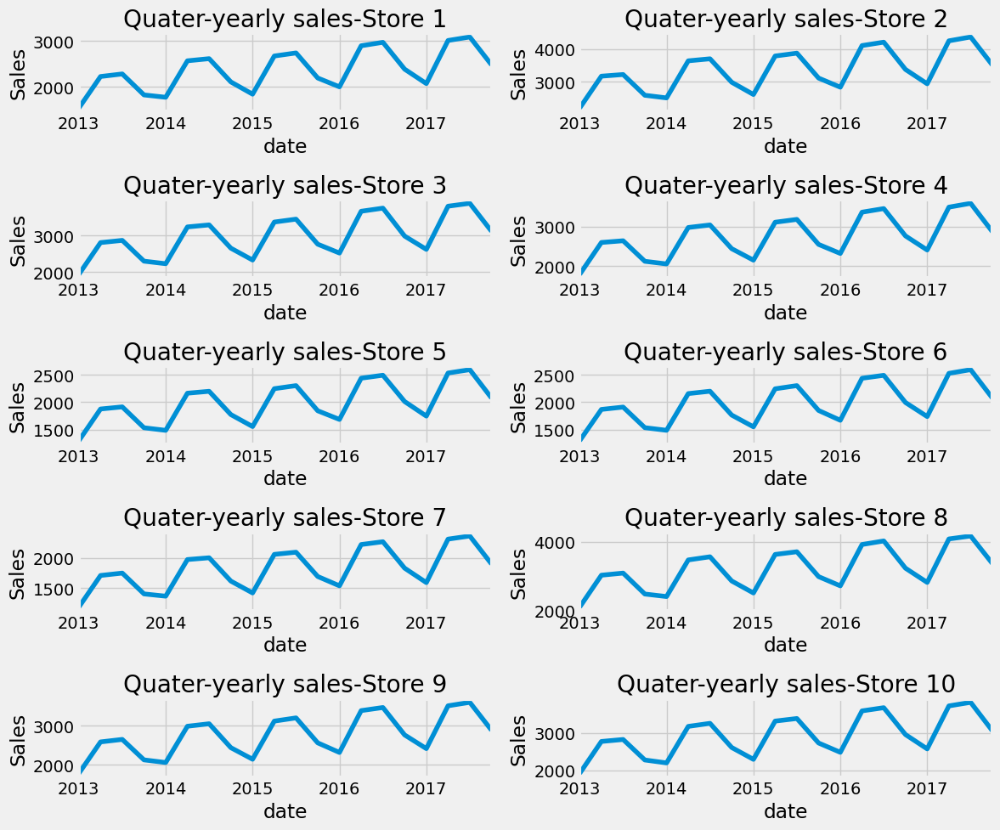

In [59]:
plt.figure(figsize=(12,10))
plt.subplot(5,2,1)
store1_Q.plot()
plt.title("Quater-yearly sales-Store 1")
plt.ylabel("Sales")
plt.subplot(5,2,2)
store2_Q.plot()
plt.title("Quater-yearly sales-Store 2")
plt.ylabel("Sales")
plt.subplot(5,2,3)
store3_Q.plot()
plt.title("Quater-yearly sales-Store 3")
plt.ylabel("Sales")
plt.subplot(5,2,4)
store4_Q.plot()
plt.title("Quater-yearly sales-Store 4")
plt.ylabel("Sales")
plt.subplot(5,2,5)
store5_Q.plot()
plt.title("Quater-yearly sales-Store 5")
plt.ylabel("Sales")
plt.subplot(5,2,6)
store6_Q.plot()
plt.title("Quater-yearly sales-Store 6")
plt.ylabel("Sales")

plt.subplot(5,2,7)
store7_Q.plot()
plt.title("Quater-yearly sales-Store 7")
plt.ylabel("Sales")

plt.subplot(5,2,8)
store8_Q.plot()
plt.title("Quater-yearly sales-Store 8")
plt.ylabel("Sales")

plt.subplot(5,2,9)
store9_Q.plot()
plt.title("Quater-yearly sales-Store 9")
plt.ylabel("Sales")

plt.subplot(5,2,10)
store10_Q.plot()
plt.title("Quater-yearly sales-Store 10")
plt.ylabel("Sales")
plt.tight_layout()

## Item wise sales analysis

In [60]:
item1= data.loc[data['item'] == 1]
item1 = item1.groupby(['date','item'])['sales'].sum().reset_index()
item1

,date,item,sales
0,2013-01-01,1,133
1,2013-01-02,1,99
2,2013-01-03,1,127
3,2013-01-04,1,145
4,2013-01-05,1,149
...,...,...,...
1821,2017-12-27,1,154
1822,2017-12-28,1,178
1823,2017-12-29,1,207
1824,2017-12-30,1,236


In [61]:
item1 = item1.set_index('date')
item1

,item,sales
date,,
2013-01-01,1,133
2013-01-02,1,99
2013-01-03,1,127
2013-01-04,1,145
2013-01-05,1,149
...,...,...
2017-12-27,1,154
2017-12-28,1,178
2017-12-29,1,207


In [62]:
item1=item1.drop('item',axis=1)


In [63]:
item1

,sales
date,
2013-01-01,133
2013-01-02,99
2013-01-03,127
2013-01-04,145
2013-01-05,149
...,...
2017-12-27,154
2017-12-28,178
2017-12-29,207


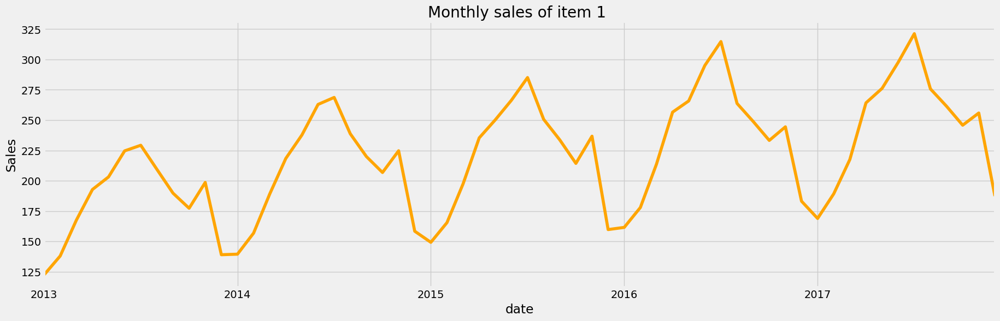

<Figure size 640x480 with 0 Axes>

In [64]:

item1_m = item1['sales'].resample('M').mean()
item1_m.plot(figsize=(20,6),color='orange')
plt.title("Monthly sales of item 1 ")
plt.ylabel("Sales")
plt.show()
plt.tight_layout()

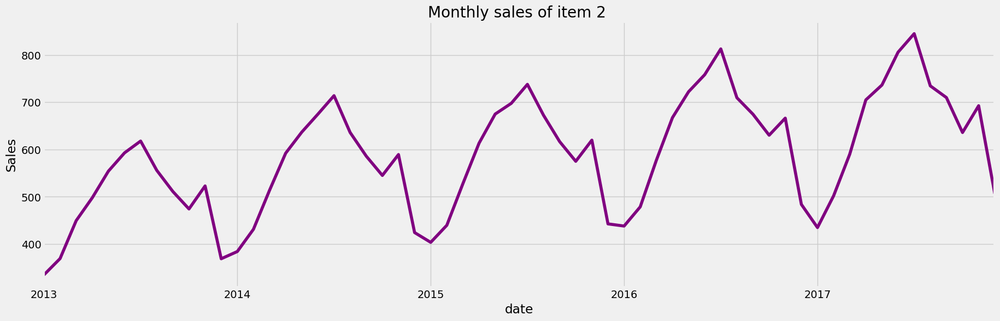

<Figure size 640x480 with 0 Axes>

In [65]:
item2= data.loc[data['item'] == 2]
item2 = item2.groupby(['date','item'])['sales'].sum().reset_index()
item2 = item2.set_index('date')
item2_m = item2['sales'].resample('M').mean()
item2_m.plot(figsize=(20,6),color='purple')
plt.title("Monthly sales of item 2 ")
plt.ylabel("Sales")
plt.show()
plt.tight_layout()

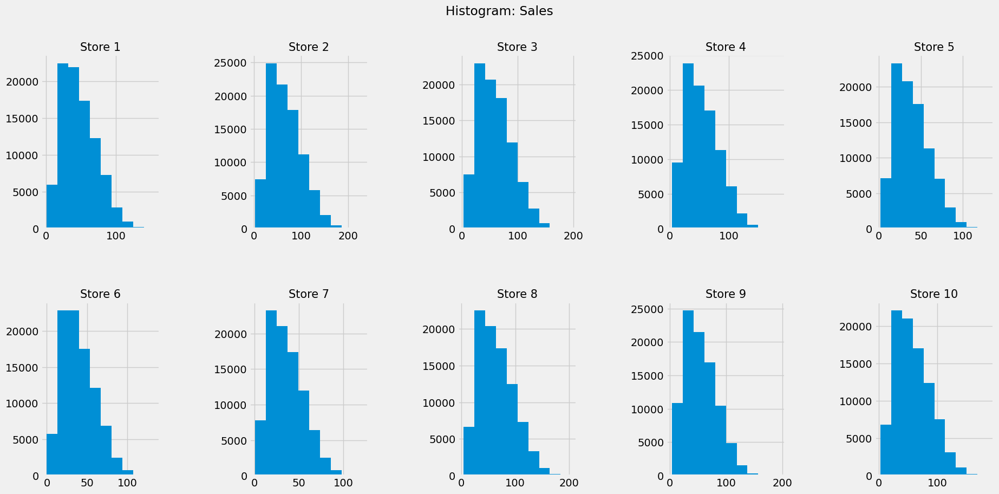

In [66]:
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
for i in range(1,11):
    if i < 6:
        data[data.store == i].sales.hist(ax=axes[0, i-1])
        axes[0,i-1].set_title("Store " + str(i), fontsize = 15)
        
    else:
        data[data.store == i].sales.hist(ax=axes[1, i - 6])
        axes[1,i-6].set_title("Store " + str(i), fontsize = 15)
plt.tight_layout(pad=4.5)
plt.suptitle("Histogram: Sales");

### Feature Engineering

In [67]:
def create_date_features(df):
    data['month'] = data.date.dt.month
    data['day_of_month'] = data.date.dt.day
    data['day_of_year'] = data.date.dt.dayofyear
    data['week_of_year'] = data.date.dt.weekofyear
    data['day_of_week'] = data.date.dt.dayofweek
    data['year'] = data.date.dt.year
    data["is_wknd"] = data.date.dt.weekday // 4
    data['is_month_start'] = data.date.dt.is_month_start.astype(int)
    data['is_month_end'] = data.date.dt.is_month_end.astype(int)
    return data

data = create_date_features(data)
create_date_features(data)

,date,store,item,sales,month,day_of_month,day_of_year,week_of_year,day_of_week,year,is_wknd,is_month_start,is_month_end
0,2013-01-01,1,1,13,1,1,1,1,1,2013,0,1,0
1,2013-01-02,1,1,11,1,2,2,1,2,2013,0,0,0
2,2013-01-03,1,1,14,1,3,3,1,3,2013,0,0,0
3,2013-01-04,1,1,13,1,4,4,1,4,2013,1,0,0
4,2013-01-05,1,1,10,1,5,5,1,5,2013,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
912995,2017-12-27,10,50,63,12,27,361,52,2,2017,0,0,0
912996,2017-12-28,10,50,59,12,28,362,52,3,2017,0,0,0
912997,2017-12-29,10,50,74,12,29,363,52,4,2017,1,0,0
912998,2017-12-30,10,50,62,12,30,364,52,5,2017,1,0,0


### Sales of item 1 in 2013

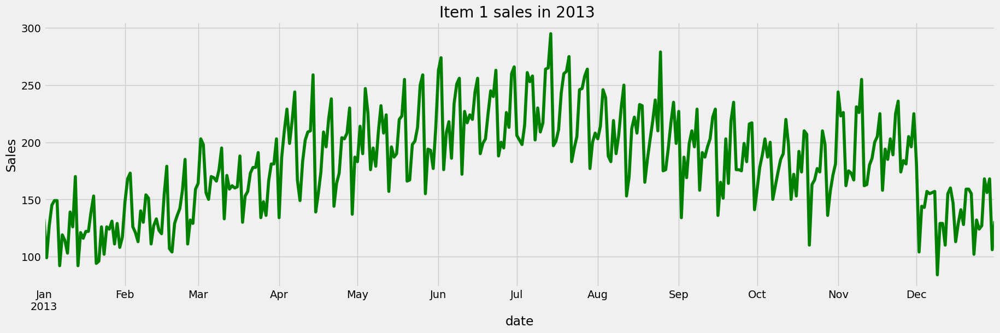

<Figure size 640x480 with 0 Axes>

In [68]:
item1_2013= data.loc[(data['item'] == 1) & (data['year']==2013)]
item1_2013 = item1_2013.groupby(['date','item'])['sales'].sum().reset_index()
item1_2013 = item1_2013.set_index('date')
item1_d_2013 = item1_2013['sales'].resample('D').mean()
item1_d_2013.plot(figsize=(20,6),color='green')
plt.title("Item 1 sales in 2013 ")
plt.ylabel("Sales")
plt.show()
plt.tight_layout()

### Sales of item 2 in 2013

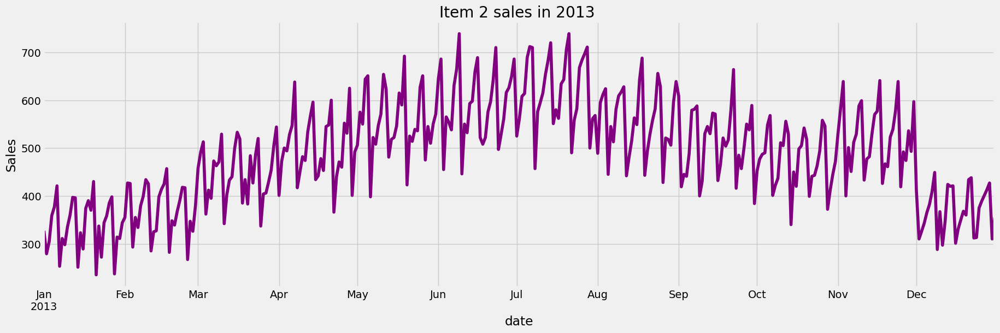

<Figure size 640x480 with 0 Axes>

In [69]:
item2_2013= data.loc[(data['item'] == 2) & (data['year']==2013)]
item2_2013 = item2_2013.groupby(['date','item'])['sales'].sum().reset_index()
item2_2013 = item2_2013.set_index('date')
item2_d_2013 = item2_2013['sales'].resample('D').mean()
item2_d_2013.plot(figsize=(20,6),color='purple')
plt.title("Item 2 sales in 2013 ")
plt.ylabel("Sales")
plt.show()
plt.tight_layout()

In [70]:
item2_2013

,item,sales
date,,
2013-01-01,2,327
2013-01-02,2,279
2013-01-03,2,304
2013-01-04,2,359
2013-01-05,2,377
...,...,...
2013-12-27,2,401
2013-12-28,2,413
2013-12-29,2,427


### Monthly trend and seasonality of different store sales

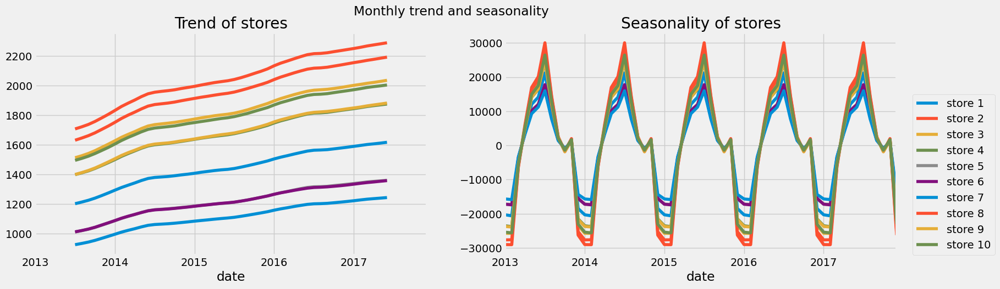

In [71]:
ax1 = plt.subplot(1,2,1)
plt.title('Trend of stores')
for i in data['store'].unique():
    store_i = data.loc[data['store'] == i]
    store_i = store_i.groupby('date')['sales'].mean().reset_index()
    store_i = store_i.set_index('date')
    store_i = store_i['sales'].resample('M').sum()
    decomposition_store_i = sm.tsa.seasonal_decompose(store_i,model='additive')
    decomposition_store_i.trend.plot(figsize=(18,5))
    

ax2= plt.subplot(1,2,2)
plt.title('Seasonality of stores')
for i in data['store'].unique():
    store_i = data.loc[data['store'] == i]
    store_i = store_i.groupby('date')['sales'].sum().reset_index()
    store_i = store_i.set_index('date')
    store_i = store_i['sales'].resample('M').sum()
    decomposition_store_i = sm.tsa.seasonal_decompose(store_i,model='additive')
    decomposition_store_i.seasonal.plot(figsize=(18,5))
    plt.legend(('store 1','store 2','store 3','store 4','store 5','store 6','store 7','store 8','store 9','store 10'),loc=(1.04, 0))
    plt.suptitle("Monthly trend and seasonality");

## ACF

In [72]:
from pandas.plotting import register_matplotlib_converters
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
register_matplotlib_converters()

<Figure size 1200x1000 with 0 Axes>

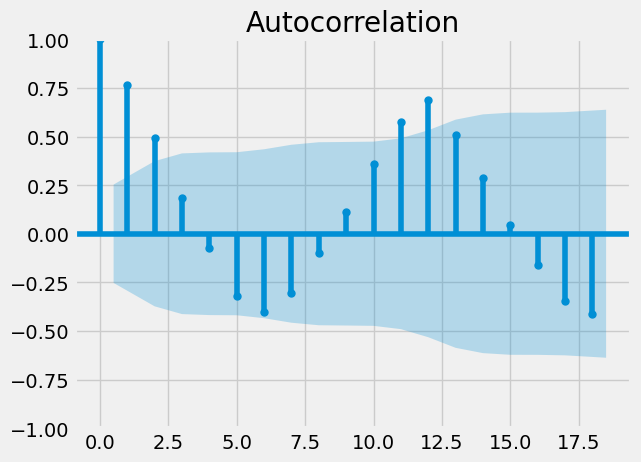

In [73]:
#store 1
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store1_m)
plt.show()

<Figure size 1200x1000 with 0 Axes>

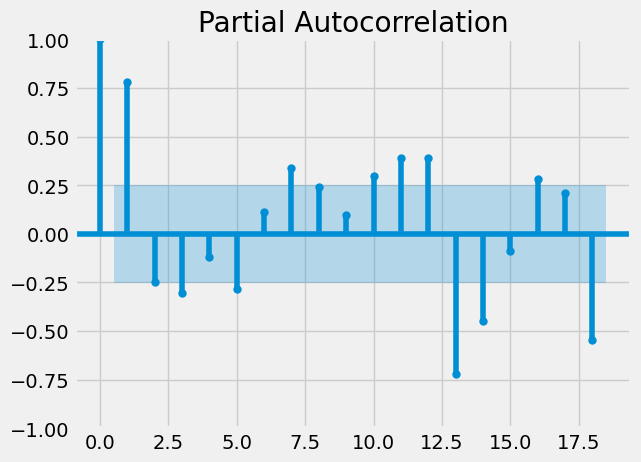

In [74]:
# store 1
plt.figure(figsize=(12,10))
pacf_plot = plot_pacf(store1_m)
plt.show()

In [75]:
#store 2

<Figure size 1200x1000 with 0 Axes>

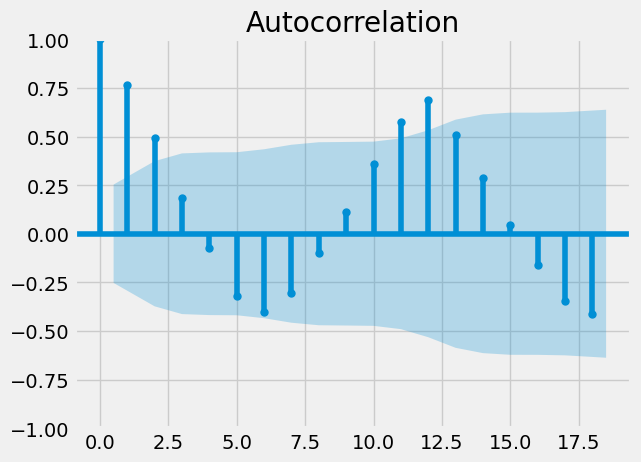

In [76]:
plt.figure(figsize=(12,10))
acf_plot = plot_acf(store2_m)
plt.show()

## PACF

<Figure size 1200x1000 with 0 Axes>

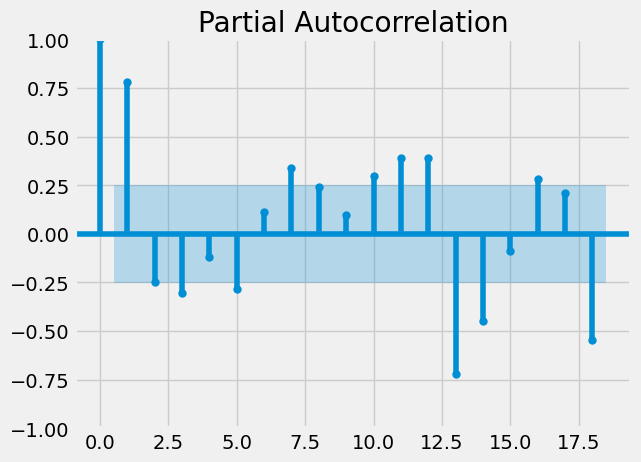

In [77]:
plt.figure(figsize=(12,10))
pacf_plot = plot_pacf(store2_m)
plt.show()

### Based on PACF, we should start with an Auto Regressive model with lags 1, 2, 4,5,6,7,8,9,14,15,16,21,22,29

## Perform ets decomposition

In [84]:
store1_m.head()

date
2013-01-01    1325.064516
2013-02-01    1475.214286
2013-03-01    1800.870968
2013-04-01    2050.766667
2013-05-01    2234.580645
Freq: MS, Name: sales, dtype: float64

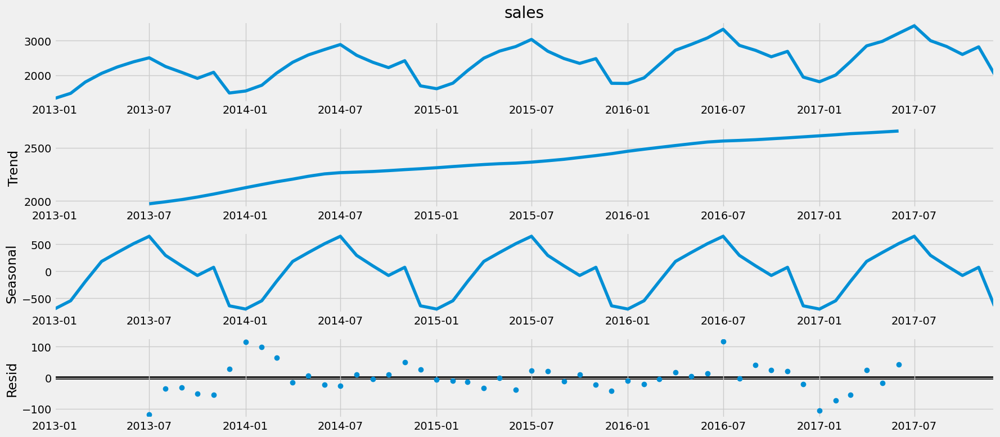

In [85]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store1_m,model='additive')
fig = decomposition_office.plot()
plt.show()

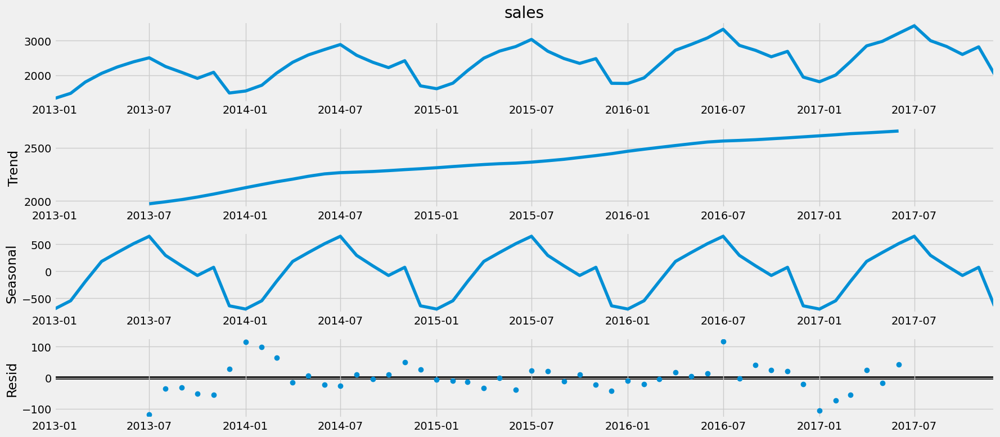

In [86]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store2_m,model='additive')
fig = decomposition_office.plot()
plt.show()

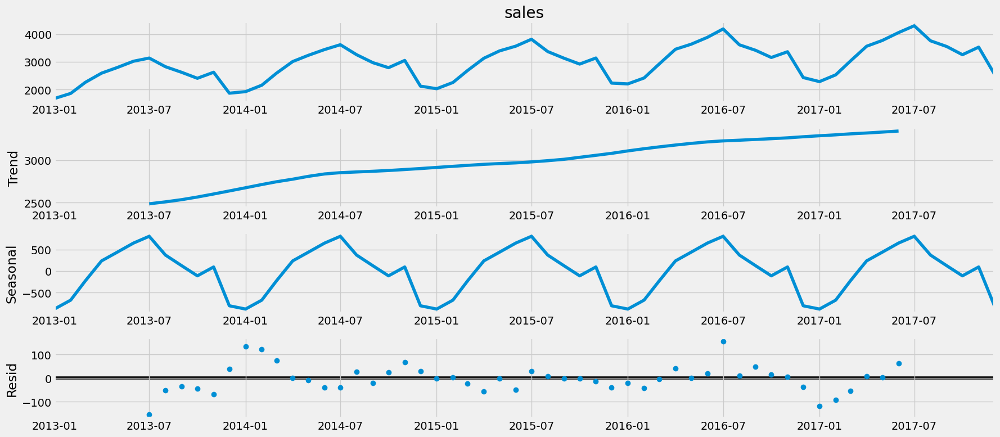

In [87]:


from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store3_m,model='additive')
fig = decomposition_office.plot()
plt.show()

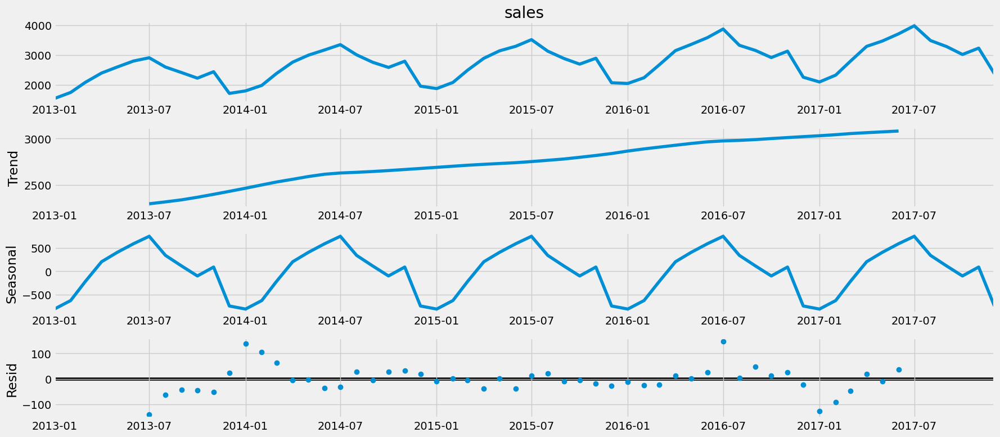

In [88]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store4_m,model='additive')
fig = decomposition_office.plot()
plt.show()

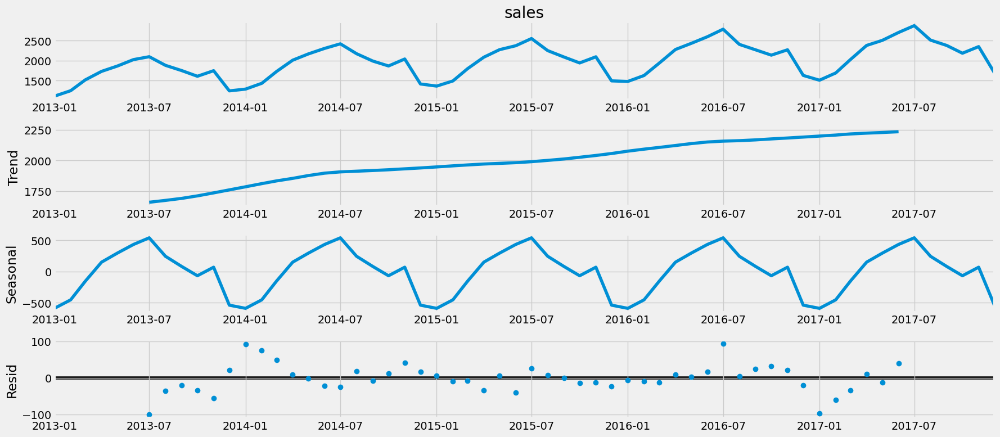

In [89]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store5_m,model='additive')
fig = decomposition_office.plot()
plt.show()

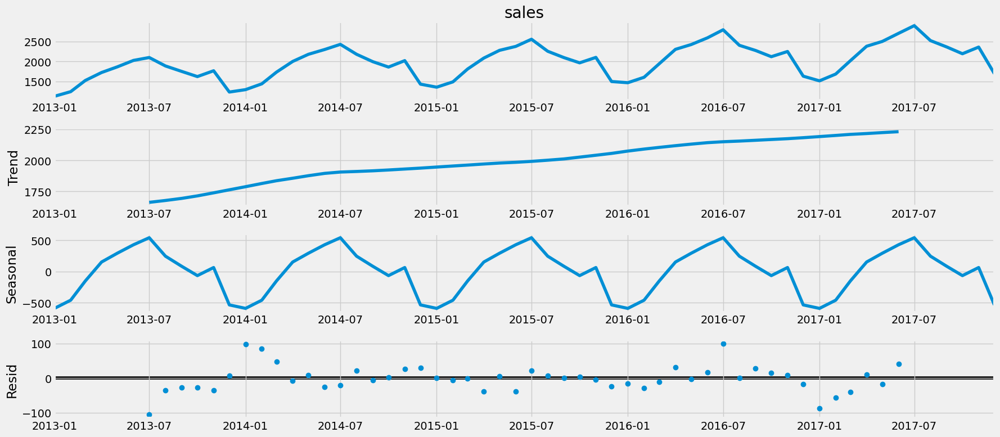

In [90]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store6_m,model='additive')
fig = decomposition_office.plot()
plt.show()

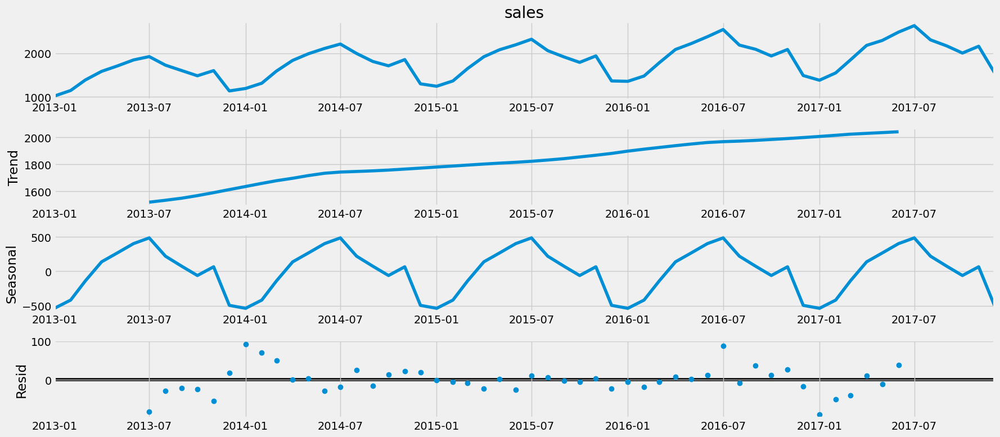

In [91]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store7_m,model='additive')
fig = decomposition_office.plot()
plt.show()

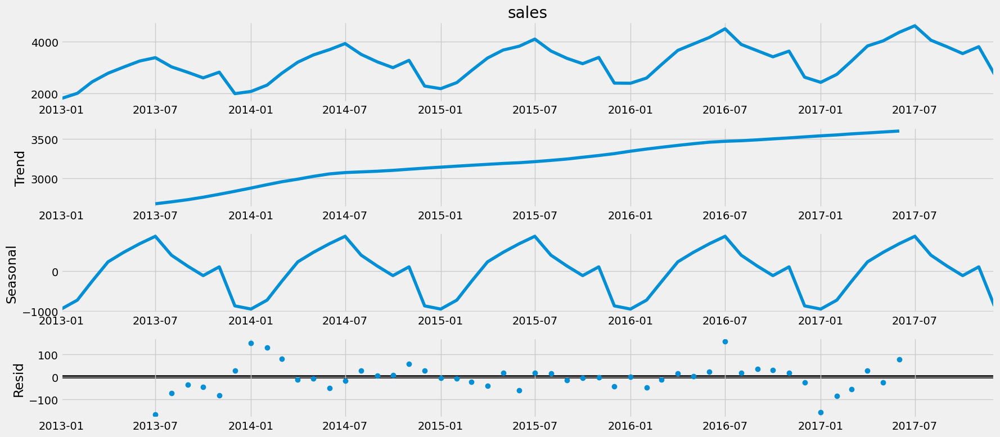

In [92]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store8_m,model='additive')
fig = decomposition_office.plot()
plt.show()

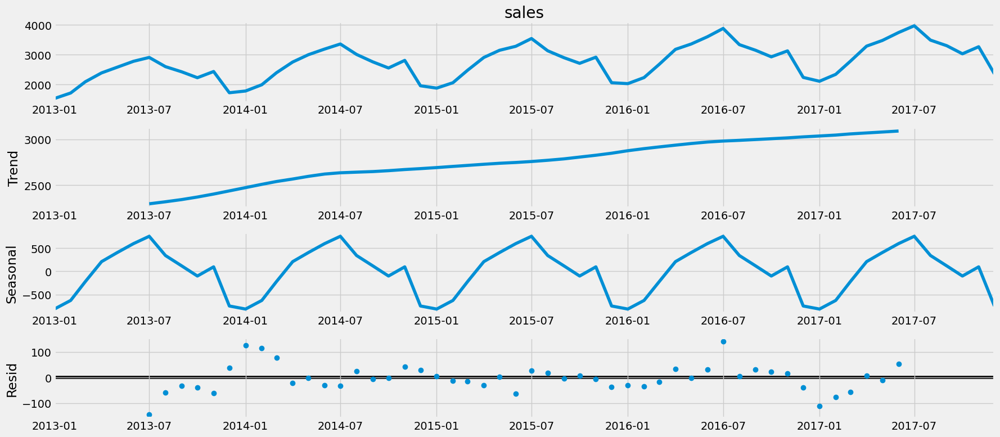

In [93]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store9_m,model='additive')
fig = decomposition_office.plot()
plt.show()

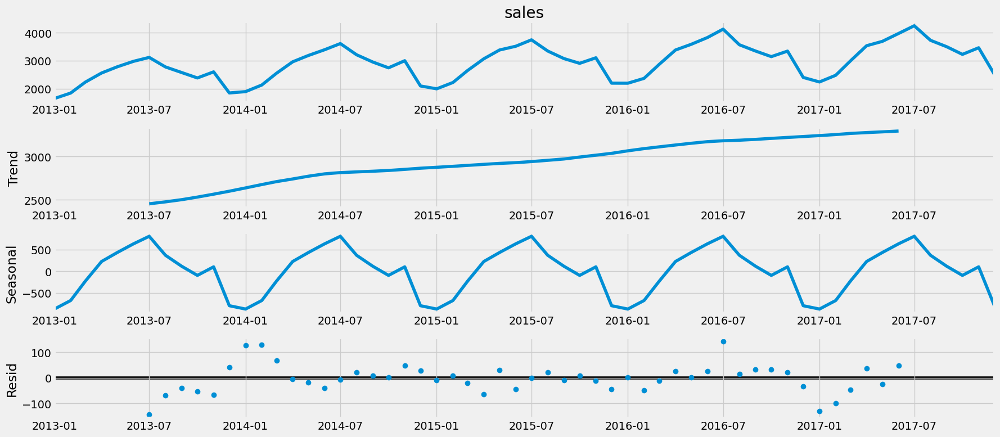

In [94]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store10_m,model='additive')
fig = decomposition_office.plot()
plt.show()

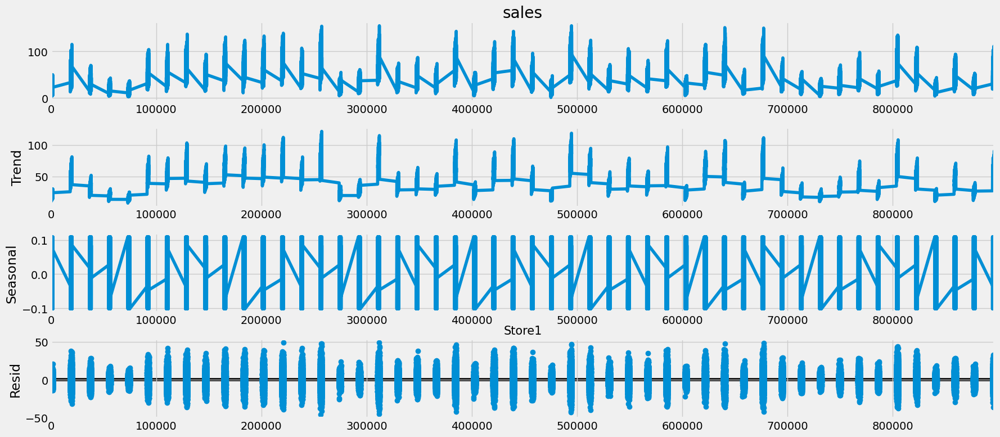

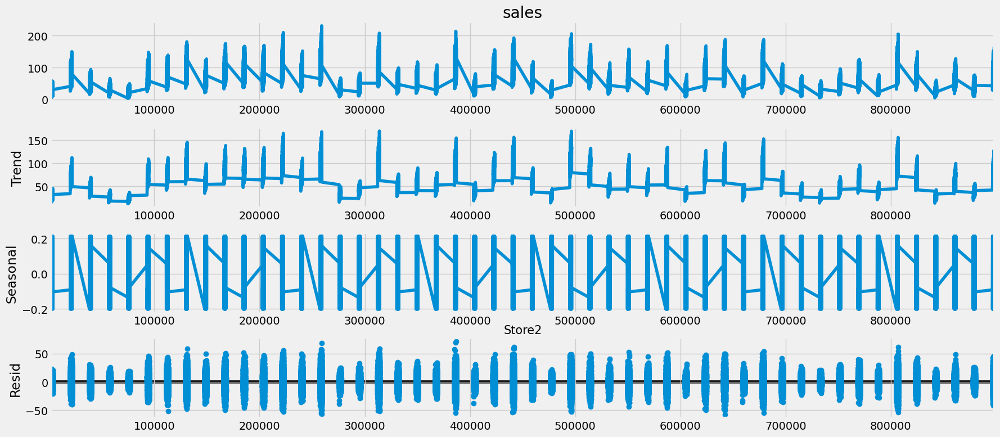

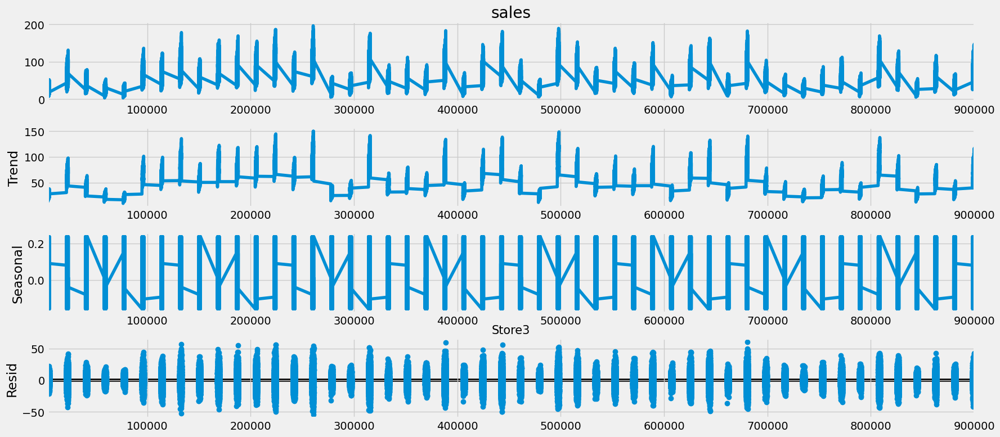

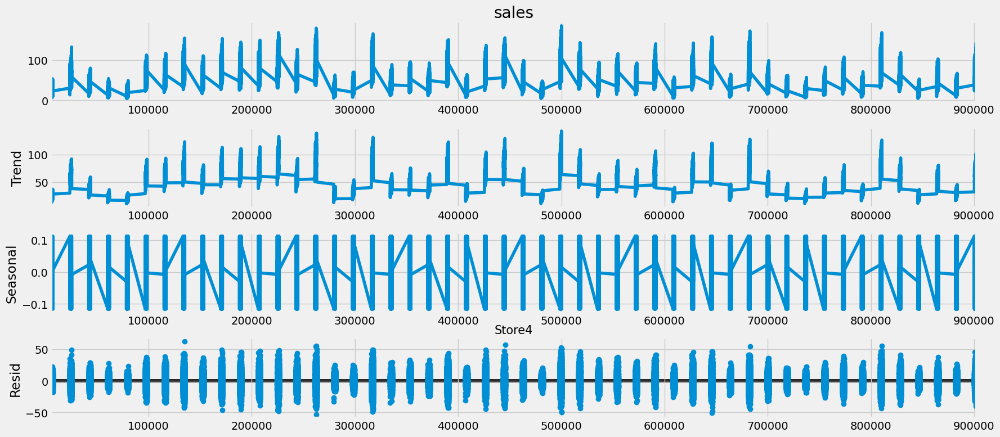

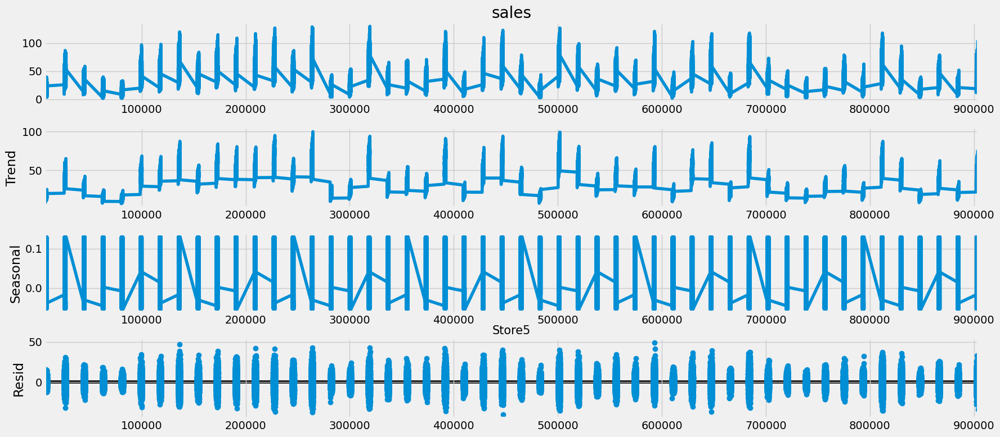

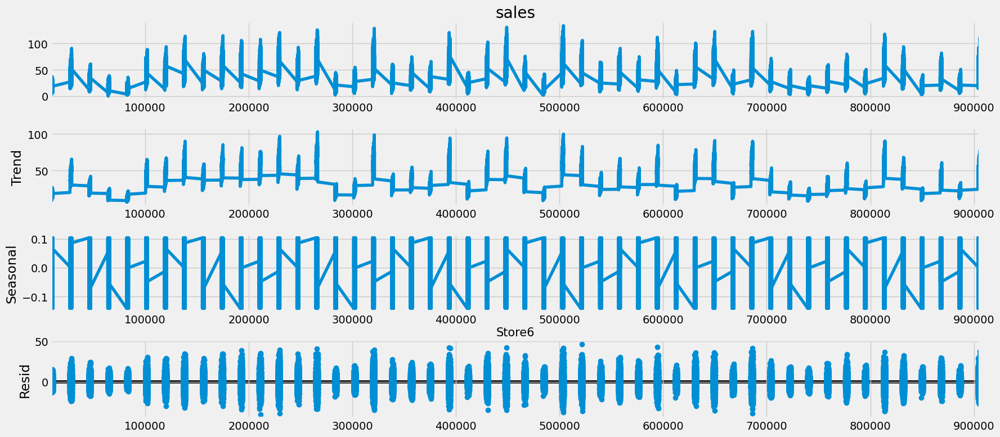

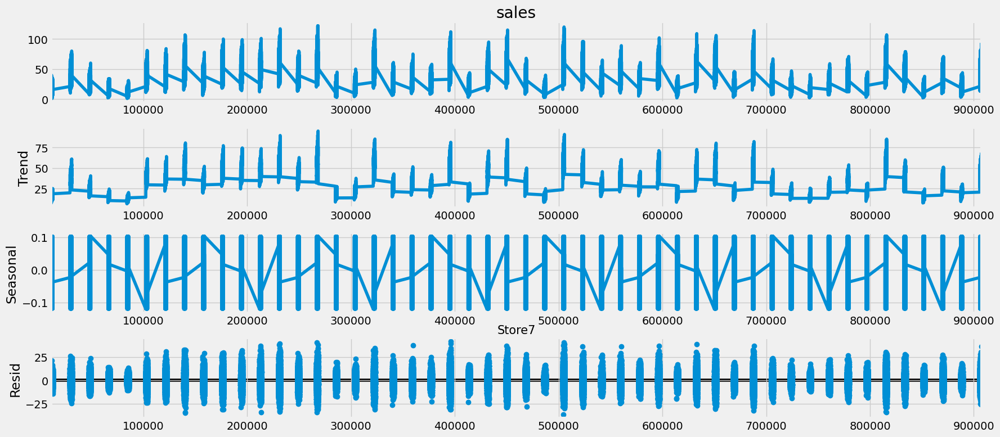

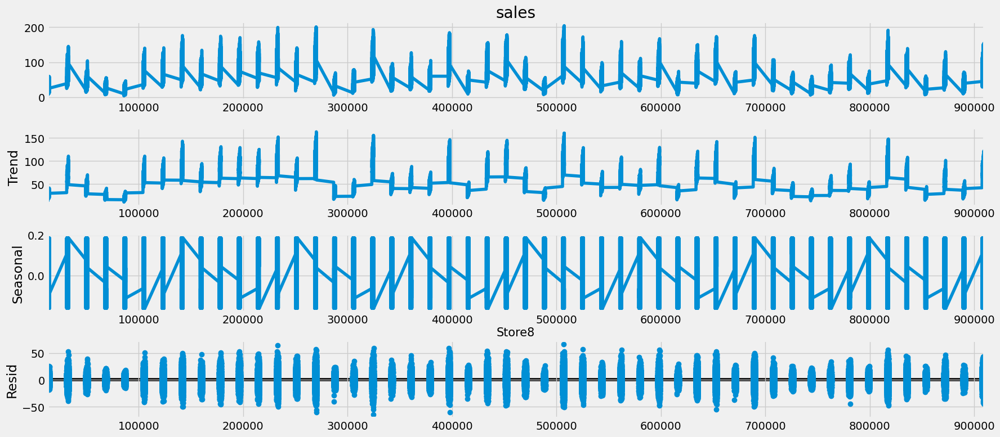

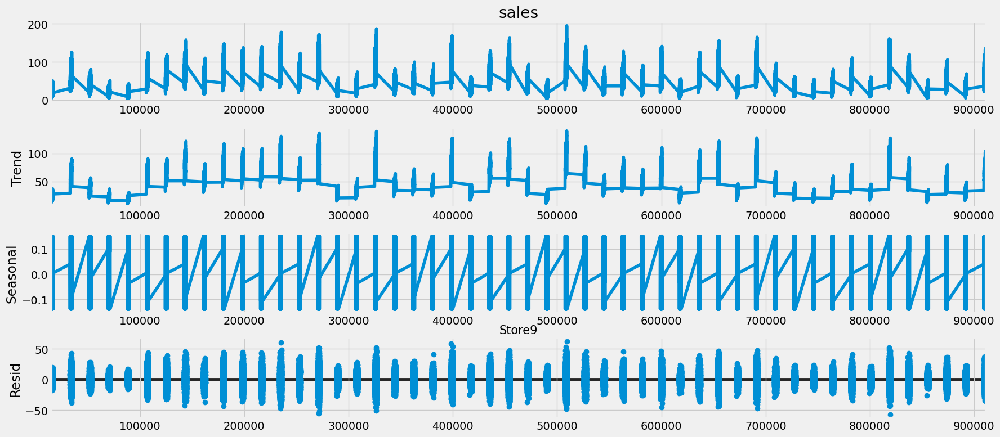

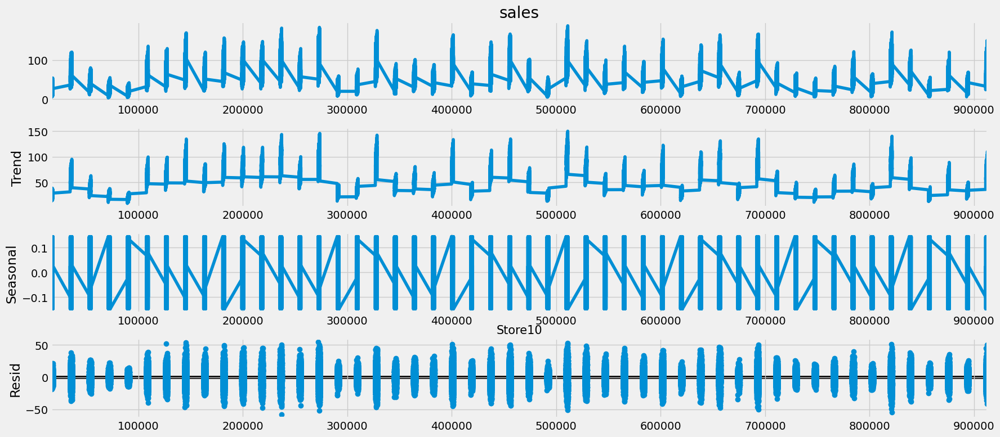

In [95]:
from statsmodels.tsa.seasonal import seasonal_decompose
for i in data['store'].unique():    
    store_i = data.loc[data['store'] == i]
    decompose_ts_add = seasonal_decompose(store_i.sales, model = "additive", period = 12)
    decompose_ts_add.plot()
    plt.title('Store'+ str(i), fontsize = 15)
    plt.show()

In [96]:
store1_d = store1['sales'].resample('D').mean()

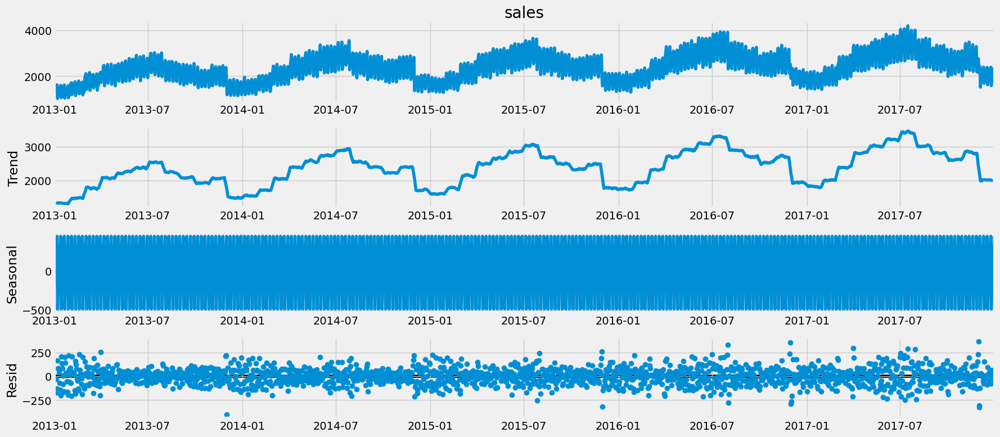

In [97]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store1_d,model='additive')
fig = decomposition_office.plot()
plt.show()

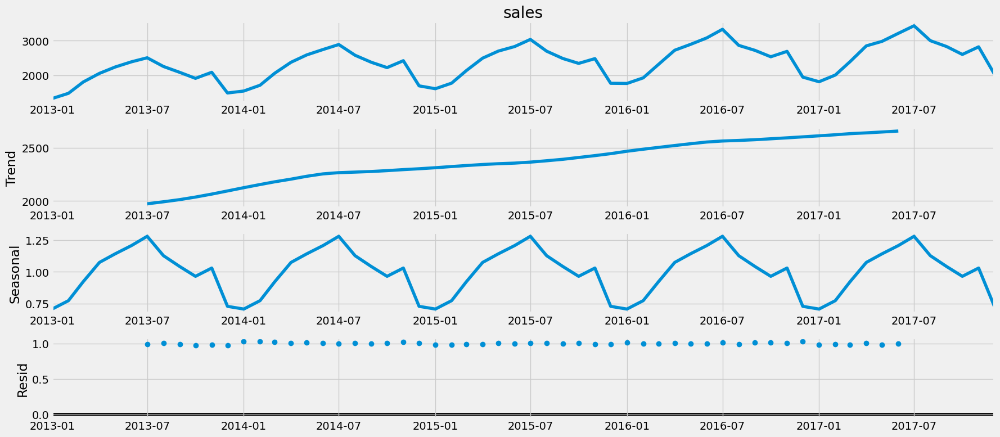

In [98]:
from pylab import rcParams
rcParams['figure.figsize']=18,8
decomposition_office = sm.tsa.seasonal_decompose(store1_m,model='multiplicative')
fig = decomposition_office.plot()
plt.show()

## Test for stationarity

In [99]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series,title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(),autolag='AIC') # .dropna() handles differenced data
    
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)

    for key,val in result[4].items():
        out[f'critical value ({key})']=val
        
    print(out.to_string())          # .to_string() removes the line "dtype: float64"
    
    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis")
        print("Reject the null hypothesis")
        print("Data has no unit root and is stationary")
    else:
        print("Weak evidence against the null hypothesis")
        print("Fail to reject the null hypothesis")
        print("Data has a unit root and is non-stationary")

In [100]:
adf_test(store1)

Augmented Dickey-Fuller Test: 
ADF test statistic        -2.984077
p-value                    0.036408
# lags used               22.000000
# observations          1803.000000
critical value (1%)       -3.433982
critical value (5%)       -2.863144
critical value (10%)      -2.567624
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [101]:
adf_test(item1)

Augmented Dickey-Fuller Test: 
ADF test statistic        -3.051073
p-value                    0.030392
# lags used               24.000000
# observations          1801.000000
critical value (1%)       -3.433986
critical value (5%)       -2.863146
critical value (10%)      -2.567625
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [229]:
adf_test(store2)

Augmented Dickey-Fuller Test: 
ADF test statistic        -3.012571
p-value                    0.033737
# lags used               23.000000
# observations          1802.000000
critical value (1%)       -3.433984
critical value (5%)       -2.863145
critical value (10%)      -2.567625
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [230]:
adf_test(store3)

Augmented Dickey-Fuller Test: 
ADF test statistic        -2.858891
p-value                    0.050342
# lags used               25.000000
# observations          1800.000000
critical value (1%)       -3.433988
critical value (5%)       -2.863147
critical value (10%)      -2.567626
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


In [231]:
adf_test(store4)

Augmented Dickey-Fuller Test: 
ADF test statistic        -3.122750
p-value                    0.024915
# lags used               22.000000
# observations          1803.000000
critical value (1%)       -3.433982
critical value (5%)       -2.863144
critical value (10%)      -2.567624
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [232]:
adf_test(store5)

Augmented Dickey-Fuller Test: 
ADF test statistic        -3.072484
p-value                    0.028658
# lags used               22.000000
# observations          1803.000000
critical value (1%)       -3.433982
critical value (5%)       -2.863144
critical value (10%)      -2.567624
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [233]:
adf_test(store6)

Augmented Dickey-Fuller Test: 
ADF test statistic        -2.975560
p-value                    0.037241
# lags used               21.000000
# observations          1804.000000
critical value (1%)       -3.433980
critical value (5%)       -2.863143
critical value (10%)      -2.567624
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [234]:
adf_test(store7)

Augmented Dickey-Fuller Test: 
ADF test statistic        -3.029018
p-value                    0.032272
# lags used               22.000000
# observations          1803.000000
critical value (1%)       -3.433982
critical value (5%)       -2.863144
critical value (10%)      -2.567624
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [235]:
adf_test(store8)

Augmented Dickey-Fuller Test: 
ADF test statistic        -3.040182
p-value                    0.031308
# lags used               23.000000
# observations          1802.000000
critical value (1%)       -3.433984
critical value (5%)       -2.863145
critical value (10%)      -2.567625
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [236]:
adf_test(store9)

Augmented Dickey-Fuller Test: 
ADF test statistic        -2.988754
p-value                    0.035958
# lags used               24.000000
# observations          1801.000000
critical value (1%)       -3.433986
critical value (5%)       -2.863146
critical value (10%)      -2.567625
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary


In [237]:
adf_test(store10)

Augmented Dickey-Fuller Test: 
ADF test statistic        -3.006268
p-value                    0.034313
# lags used               21.000000
# observations          1804.000000
critical value (1%)       -3.433980
critical value (5%)       -2.863143
critical value (10%)      -2.567624
Strong evidence against the null hypothesis
Reject the null hypothesis
Data has no unit root and is stationary



## Time series forecasting with SARIMA


## Store 1

In [102]:
len(store1_m)

60

In [103]:
60-12

48

In [104]:
#spliting train and test
train_store1_m = store1_m.iloc[:48]
test_store1_m = store1_m.iloc[48:]

In [105]:
train_store1_m

date
2013-01-01    1325.064516
2013-02-01    1475.214286
2013-03-01    1800.870968
2013-04-01    2050.766667
2013-05-01    2234.580645
2013-06-01    2384.366667
2013-07-01    2500.870968
2013-08-01    2249.838710
2013-09-01    2080.266667
2013-10-01    1907.419355
2013-11-01    2082.166667
2013-12-01    1484.806452
2014-01-01    1541.548387
2014-02-01    1708.500000
2014-03-01    2055.774194
2014-04-01    2371.633333
2014-05-01    2584.129032
2014-06-01    2739.866667
2014-07-01    2883.516129
2014-08-01    2574.000000
2014-09-01    2371.133333
2014-10-01    2217.419355
2014-11-01    2416.866667
2014-12-01    1690.806452
2015-01-01    1607.806452
2015-02-01    1768.928571
2015-03-01    2130.838710
2015-04-01    2490.033333
2015-05-01    2694.290323
2015-06-01    2824.833333
2015-07-01    3031.258065
2015-08-01    2691.677419
2015-09-01    2479.633333
2015-10-01    2339.354839
2015-11-01    2476.400000
2015-12-01    1764.548387
2016-01-01    1759.967742
2016-02-01    1921.448276
2016-03

In [106]:
test_store1_m

date
2017-01-01    1809.225806
2017-02-01    2003.500000
2017-03-01    2388.290323
2017-04-01    2844.600000
2017-05-01    2975.741935
2017-06-01    3206.266667
2017-07-01    3425.387097
2017-08-01    2995.354839
2017-09-01    2825.300000
2017-10-01    2597.387097
2017-11-01    2816.666667
2017-12-01    2030.903226
Freq: MS, Name: sales, dtype: float64

## Finding the best Model

In [107]:
#!pip install pmdarima

In [108]:
from pmdarima import auto_arima

In [109]:
model_store1= auto_arima(store1_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=510.321, Time=0.95 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=509.051, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=512.111, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=512.275, Time=0.13 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=510.737, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=510.853, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=510.569, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=510.533, Time=0.04 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=512.514, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=510.926, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.704 seconds


In [110]:
model_store1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -253.526
Date:                            Mon, 20 Feb 2023   AIC                            509.051
Time:                                    10:25:48   BIC                            510.901
Sample:                                01-01-2013   HQIC                           509.748
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2835.0701    509.222      5.567      0.000    1837.014    3833.126
===================================================================================
Ljung-Box (L1) (Q):                   0.53   Jarque-Bera (JB):                 6.83
Prob(Q):                              0.46   Prob(JB):                         0.03
Heteroskedasticity (H):               0.83   Skew:                            -0.91
Prob(H) (two-sided):                  0.71   Kurtosis:                         3.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [111]:
model_store1

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

### Lets Train the model

In [112]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [113]:
model_store1 = SARIMAX(train_store1_m,order=(1, 0, 3),seasonal_order=(1, 0, 3, 12),enforce_invertibility=False)

In [114]:
result_store1 = model_store1.fit()

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [115]:
result_store1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(1, 0, 3)x(1, 0, 3, 12)   Log Likelihood                -288.037
Date:                            Mon, 20 Feb 2023   AIC                            594.075
Time:                                    10:25:50   BIC                            610.915
Sample:                                01-01-2013   HQIC                           600.439
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9914      0.011     91.978      0.000       0.970       1.012
ma.L1         -1.8378      1.447     -1.270      0.204      -4.674       0.998
ma.L2          0.0407      0.285      0.143      0.886      -0.517       0.599
ma.L3         -0.8068      0.420     -1.922      0.055      -1.629       0.016
ar.S.L12       0.9180      0.224      4.096      0.000       0.479       1.357
ma.S.L12       0.3703      1.974      0.188      0.851      -3.499       4.240
ma.S.L24       0.6921      2.968      0.233      0.816      -5.126       6.510
ma.S.L36       0.2406      6.768      0.036      0.972     -13.024      13.505
sigma2       522.4647   1185.889      0.441      0.660   -1801.835    2846.765
===================================================================================
Ljung-Box (L1) (Q):                   2.45   Jarque-Bera (JB):                 9.65
Prob(Q):                              0.12   Prob(JB):                         0.01
Heteroskedasticity (H):               1.26   Skew:                            -0.74
Prob(H) (two-sided):                  0.65   Kurtosis:                         4.62
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

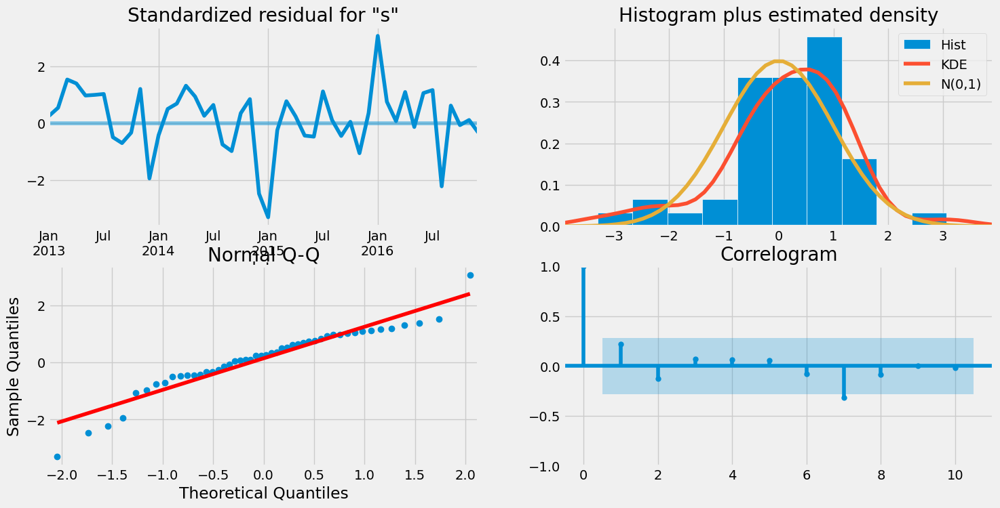

In [116]:
result_store1.plot_diagnostics(figsize=(16,8))
plt.show()

## Now lets predict  the future values

In [117]:
start = len(train_store1_m)
end = len(train_store1_m) + len(test_store1_m) - 1

In [118]:
prediction_store1 =result_store1.predict(start,end).rename('SARIMA model predictions')
prediction_store1

2017-01-01    1923.731724
2017-02-01    2065.665031
2017-03-01    2448.915727
2017-04-01    2862.052287
2017-05-01    3000.924945
2017-06-01    3188.244224
2017-07-01    3458.968511
2017-08-01    2967.418039
2017-09-01    2854.302199
2017-10-01    2660.980538
2017-11-01    2787.055007
2017-12-01    2092.016816
Freq: MS, Name: SARIMA model predictions, dtype: float64

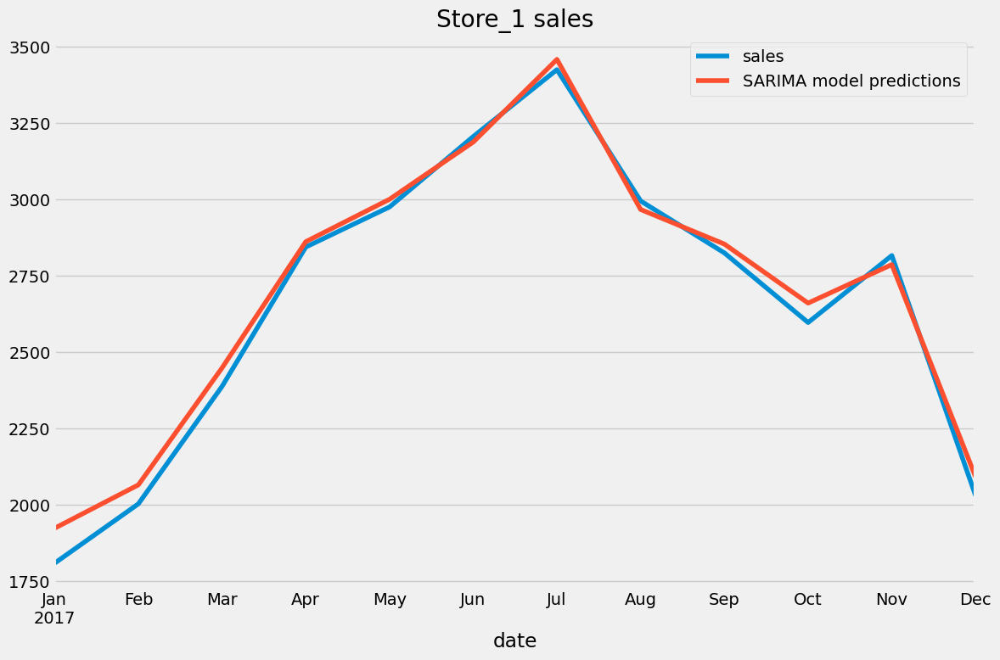

In [119]:
test_store1_m.plot(figsize=(12,8),legend=True)
prediction_store1.plot(legend=True)
plt.title("Store_1 sales")
plt.tight_layout()

### Evaluation model

In [120]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from statsmodels.tools.eval_measures import rmse

In [121]:
mean_squared_error(test_store1_m,prediction_store1)

2776.6884444633483

In [122]:
rmse(test_store1_m,prediction_store1)

52.69429233288315

In [123]:
test_store1_m.mean()

2659.885304659498

#### Comparing the mean value to the root mean square value, we can say that the model predicted in a good way

## Now let us forecast  future values

In [124]:
model_store1_final = SARIMAX(store1_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)

In [125]:
result_store1_final = model_store1_final.fit()

In [126]:
forecast_store1 = result_store1_final.predict(len(store1_m),len(store1_m)+11,typ='levels').rename('SARIMA forecast')

Text(0.5, 1.0, 'Store_1 sales')

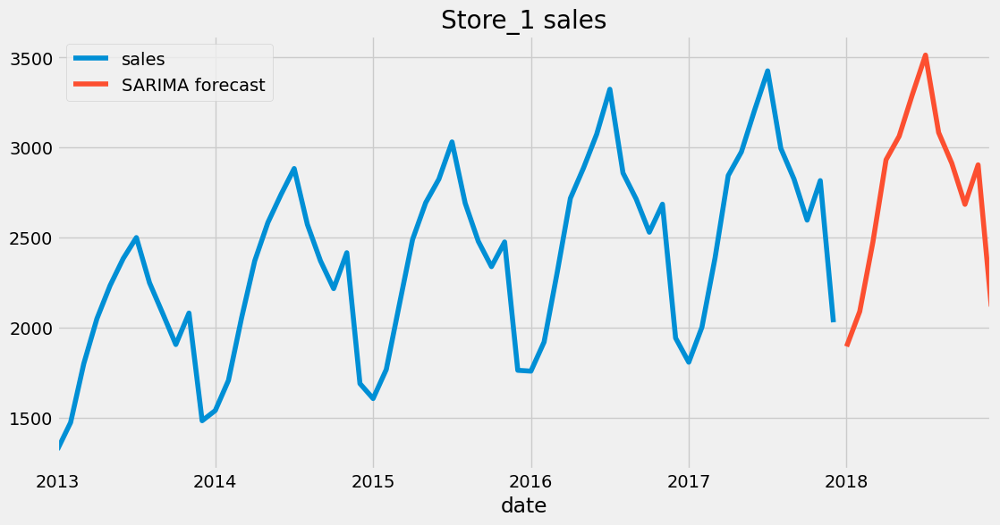

In [127]:
store1_m.plot(legend=True,figsize=(12,6))
forecast_store1.plot(legend=True)
plt.title("Store_1 sales")


### Store 1 forecasted sales for year 2018

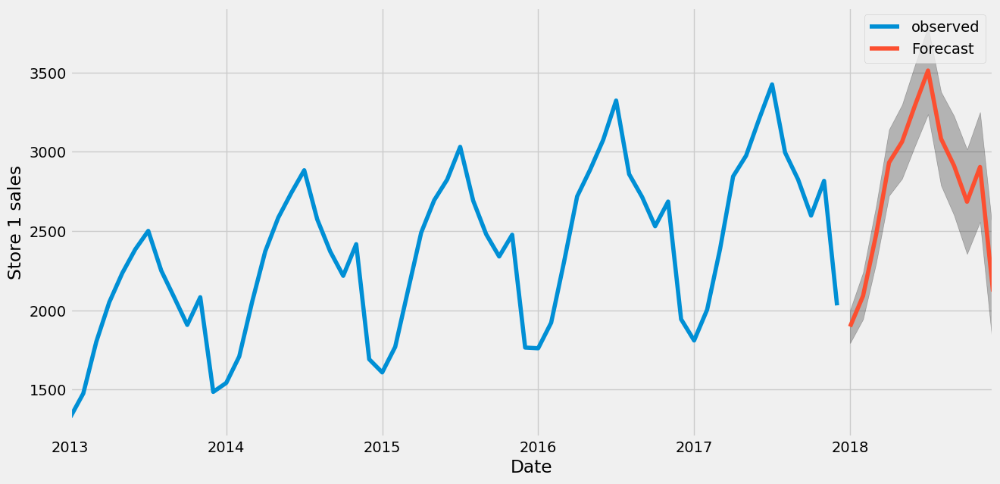

In [128]:
pred_store1 = result_store1_final.get_forecast(steps=12)
pred_ci_store1 = pred_store1.conf_int()
ax = store1_m.plot(label='observed',figsize=(14,7))
pred_store1.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store1.index,
               pred_ci_store1.iloc[:,0],
               pred_ci_store1.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 1 sales')
plt.legend()
plt.show()

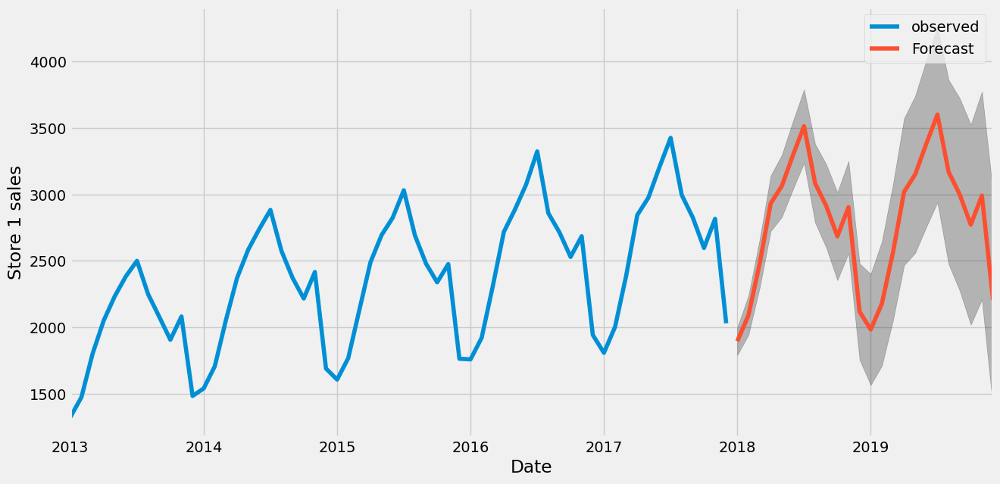

In [129]:
pred_store1 = result_store1_final.get_forecast(steps=24)
pred_ci_store1 = pred_store1.conf_int()
ax = store1_m.plot(label='observed',figsize=(14,7))
pred_store1.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store1.index,
               pred_ci_store1.iloc[:,0],
               pred_ci_store1.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 1 sales')
plt.legend()
plt.show()

## Store 2

In [130]:
len(store2_m)

60

In [131]:
store2_m = store2['sales'].resample('MS').mean()
store2_m.head()

date
2013-01-01    1887.741935
2013-02-01    2120.857143
2013-03-01    2568.032258
2013-04-01    2932.900000
2013-05-01    3172.935484
Freq: MS, Name: sales, dtype: float64

In [132]:
#spliting train and test
train_store2_m = store2_m.iloc[:48]
test_store2_m = store2_m.iloc[48:]

### Finding the best Model

In [133]:
model_store2= auto_arima(store2_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=542.300, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=545.063, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=545.329, Time=0.12 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=543.409, Time=0.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=543.719, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=544.009, Time=0.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=543.904, Time=0.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=inf, Time=0.09 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=544.219, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.532 seconds


In [134]:
model_store2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -270.150
Date:                            Mon, 20 Feb 2023   AIC                            542.300
Time:                                    10:25:54   BIC                            544.151
Sample:                                01-01-2013   HQIC                           542.997
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      5751.0694   1044.959      5.504      0.000    3702.988    7799.151
===================================================================================
Ljung-Box (L1) (Q):                   0.33   Jarque-Bera (JB):                 5.07
Prob(Q):                              0.57   Prob(JB):                         0.08
Heteroskedasticity (H):               0.64   Skew:                            -0.77
Prob(H) (two-sided):                  0.38   Kurtosis:                         3.45
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [135]:
model_store2

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

### Lets Train the model

In [136]:
model_store2 = SARIMAX(train_store2_m,order=(3,1,0),seasonal_order=(3,1,0, 12),enforce_invertibility=False)
result_store2 = model_store2.fit()
result_store2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(3, 1, 0)x(3, 1, 0, 12)   Log Likelihood                -199.141
Date:                            Mon, 20 Feb 2023   AIC                            412.283
Time:                                    10:25:55   BIC                            423.170
Sample:                                01-01-2013   HQIC                           416.041
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1592      0.196     -0.812      0.417      -0.544       0.225
ar.L2         -0.1365      0.208     -0.656      0.512      -0.545       0.272
ar.L3          0.3282      0.263      1.246      0.213      -0.188       0.844
ar.S.L12      -0.2275      3.978     -0.057      0.954      -8.024       7.569
ar.S.L24       0.6155      0.411      1.499      0.134      -0.189       1.420
ar.S.L36       0.2693      6.823      0.039      0.969     -13.104      13.643
sigma2      3411.4948   1.24e+04      0.276      0.782   -2.08e+04    2.76e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                 1.04
Prob(Q):                              0.81   Prob(JB):                         0.59
Heteroskedasticity (H):               0.70   Skew:                            -0.40
Prob(H) (two-sided):                  0.55   Kurtosis:                         3.25
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

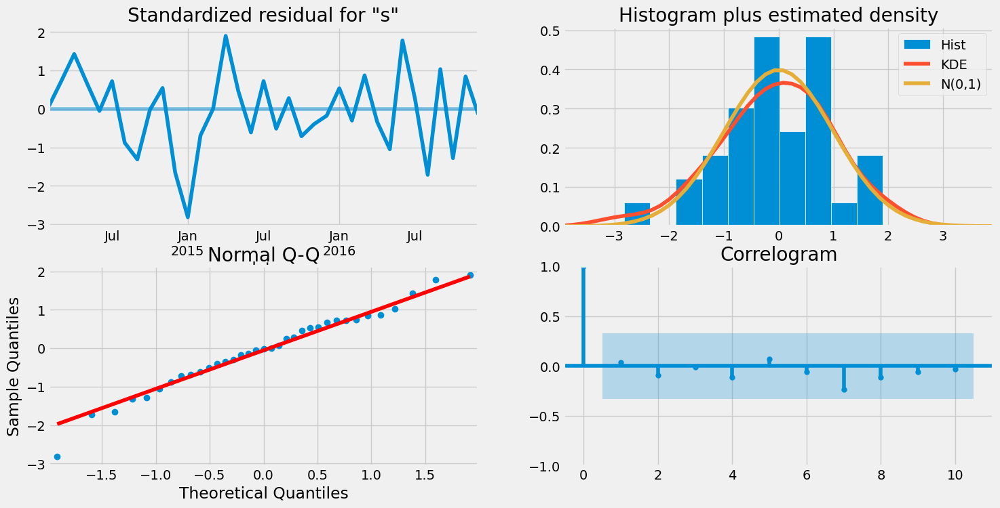

In [137]:
result_store2.plot_diagnostics(figsize=(16,8))
plt.show()

### Now lets predict  the future values

In [138]:
start = len(train_store2_m)
end = len(train_store2_m) + len(test_store2_m) - 1

In [139]:
prediction_store2 =result_store2.predict(start,end).rename('SARIMA model predictions')
prediction_store2

2017-01-01    2586.450969
2017-02-01    2818.202911
2017-03-01    3365.275690
2017-04-01    3992.575021
2017-05-01    4258.889845
2017-06-01    4489.889398
2017-07-01    4884.558171
2017-08-01    4234.307281
2017-09-01    3969.128888
2017-10-01    3715.403206
2017-11-01    3944.081534
2017-12-01    2851.073707
Freq: MS, Name: SARIMA model predictions, dtype: float64

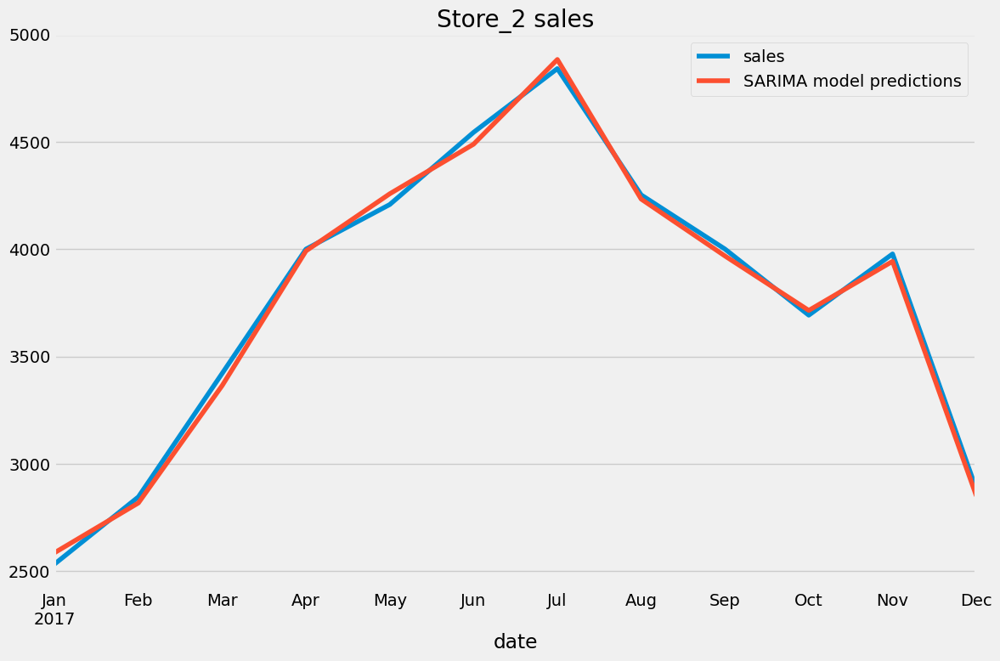

In [140]:
test_store2_m.plot(figsize=(12,8),legend=True)
prediction_store2.plot(legend=True)
plt.title("Store_2 sales")
plt.tight_layout()

### Evaluation model

In [141]:
mean_squared_error(test_store2_m,prediction_store2)

1523.6685527274194

In [142]:
rmse(test_store2_m,prediction_store2)

39.034197221505906

In [143]:
test_store2_m.mean()

3767.342921146954

### Now let us forecast  future values

In [144]:
model_store2_final = SARIMAX(store2_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store2_final = model_store2_final.fit()
forecast_store2 = result_store2_final.predict(len(store2_m),len(store2_m)+11,typ='levels').rename('SARIMA forecast')

Text(0.5, 1.0, 'Store_2 sales')

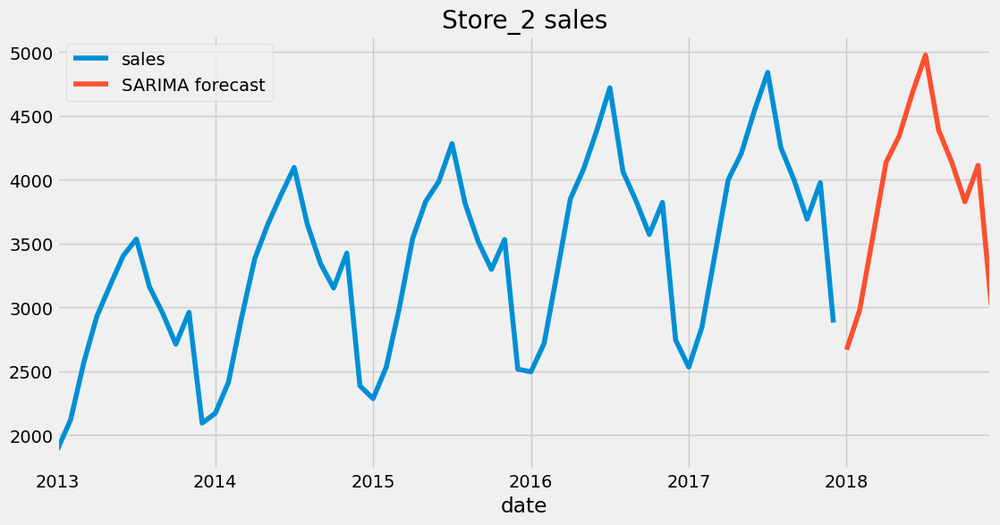

In [145]:
store2_m.plot(legend=True,figsize=(12,6))
forecast_store2.plot(legend=True)
plt.title("Store_2 sales")


### Store 2 forecasted sales for year 2018

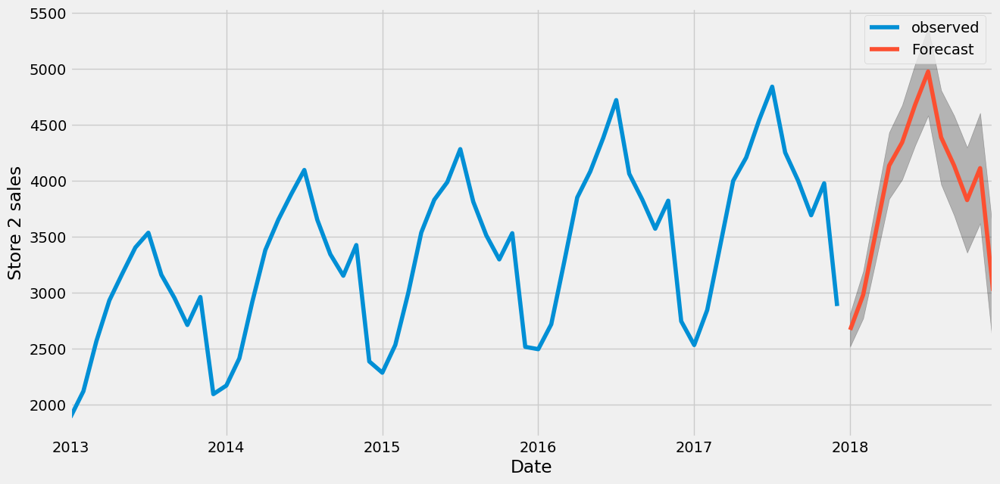

In [146]:

pred_store2 = result_store2_final.get_forecast(steps=12)
pred_ci_store2 = pred_store2.conf_int()
ax = store2_m.plot(label='observed',figsize=(14,7))
pred_store2.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store2.index,
               pred_ci_store2.iloc[:,0],
               pred_ci_store2.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 2 sales')
plt.legend()
plt.show()

## Store 3

In [147]:
#spliting train and test


train_store3_m = store3_m.iloc[:48]
test_store3_m = store3_m.iloc[48:]
model_store3= auto_arima(store3_m,m=12,seasonal=True,trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=524.465, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=527.964, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=527.987, Time=0.11 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=526.371, Time=0.06 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=526.396, Time=0.08 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.15 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=526.105, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=526.078, Time=0.05 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=527.776, Time=0.05 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=526.389, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.516 seconds


In [148]:
model_store3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   60
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -261.233
Date:                            Mon, 20 Feb 2023   AIC                            524.465
Time:                                    10:25:58   BIC                            526.315
Sample:                                01-01-2013   HQIC                           525.162
                                     - 12-01-2017                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3935.2325    775.012      5.078      0.000    2416.237    5454.229
===================================================================================
Ljung-Box (L1) (Q):                   0.39   Jarque-Bera (JB):                 4.68
Prob(Q):                              0.53   Prob(JB):                         0.10
Heteroskedasticity (H):               0.40   Skew:                            -0.77
Prob(H) (two-sided):                  0.08   Kurtosis:                         3.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [149]:
model_store3

ARIMA(order=(0, 1, 0), scoring_args={}, seasonal_order=(0, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

### Lets Train the model

In [150]:
model_store3 = SARIMAX(train_store3_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store3 = model_store3.fit()
result_store3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -196.765
Date:                            Mon, 20 Feb 2023   AIC                            395.529
Time:                                    10:25:59   BIC                            397.084
Sample:                                01-01-2013   HQIC                           396.066
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      4472.6842   1072.651      4.170      0.000    2370.327    6575.041
===================================================================================
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):                 3.57
Prob(Q):                              0.77   Prob(JB):                         0.17
Heteroskedasticity (H):               0.69   Skew:                            -0.78
Prob(H) (two-sided):                  0.53   Kurtosis:                         2.92
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

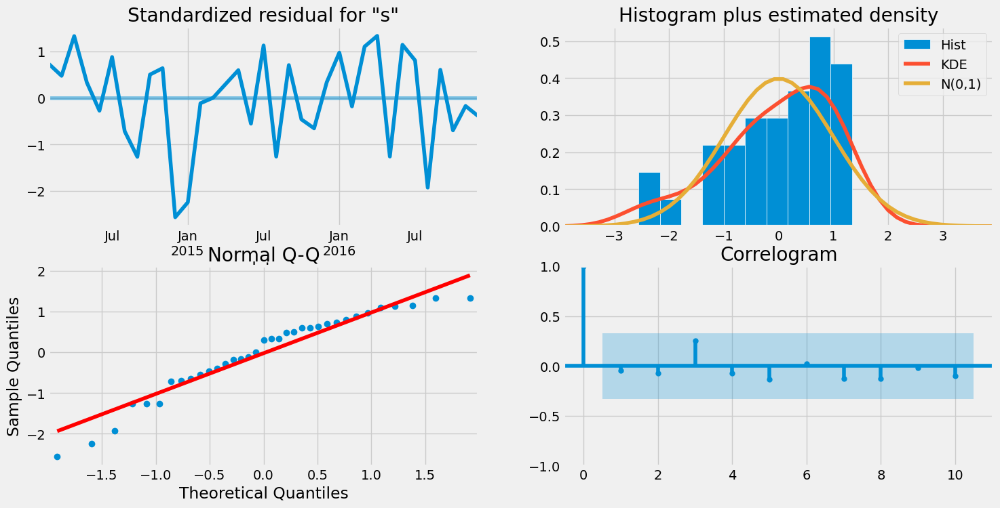

In [151]:
result_store3.plot_diagnostics(figsize=(16,8))
plt.show()

### Now lets predict  the future values

In [152]:
start = len(train_store3_m)
end = len(train_store3_m) + len(test_store3_m) - 1
prediction_store3 =result_store3.predict(start,end).rename('SARIMA model predictions')
prediction_store3

2017-01-01    2404.967742
2017-02-01    2617.962180
2017-03-01    3124.612903
2017-04-01    3655.315054
2017-05-01    3837.161290
2017-06-01    4085.081720
2017-07-01    4388.387097
2017-08-01    3815.806452
2017-09-01    3616.715054
2017-10-01    3357.870968
2017-11-01    3564.815054
2017-12-01    2633.806452
Freq: MS, Name: SARIMA model predictions, dtype: float64

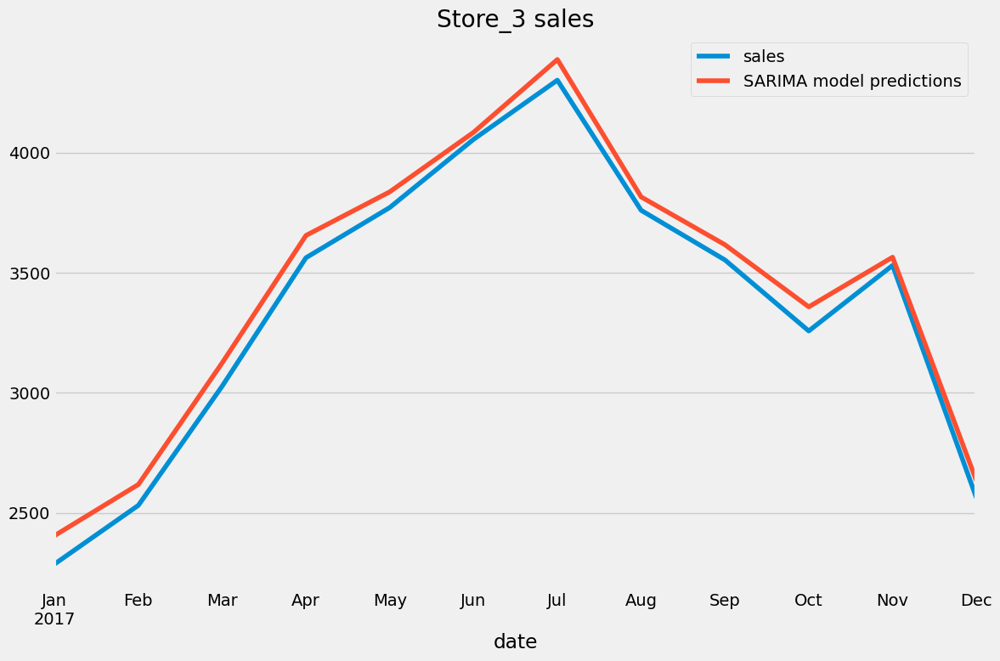

In [153]:
test_store3_m.plot(figsize=(12,8),legend=True)
prediction_store3.plot(legend=True)
plt.title("Store_3 sales")
plt.tight_layout()

### Evaluation model

In [154]:
mean_squared_error(test_store3_m,prediction_store3)

6295.4475999166925

In [155]:
rmse(test_store3_m,prediction_store3)

79.34385672449186

In [156]:
test_store3_m.mean()

3350.1655593958008

### Now let us forecast  future values

In [157]:
model_store3_final = SARIMAX(store3_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store3_final = model_store3_final.fit()
forecast_store3 = result_store3_final.predict(len(store3_m),len(store3_m)+11,typ='levels').rename('SARIMA forecast')

Text(0.5, 1.0, 'Store_3 sales')

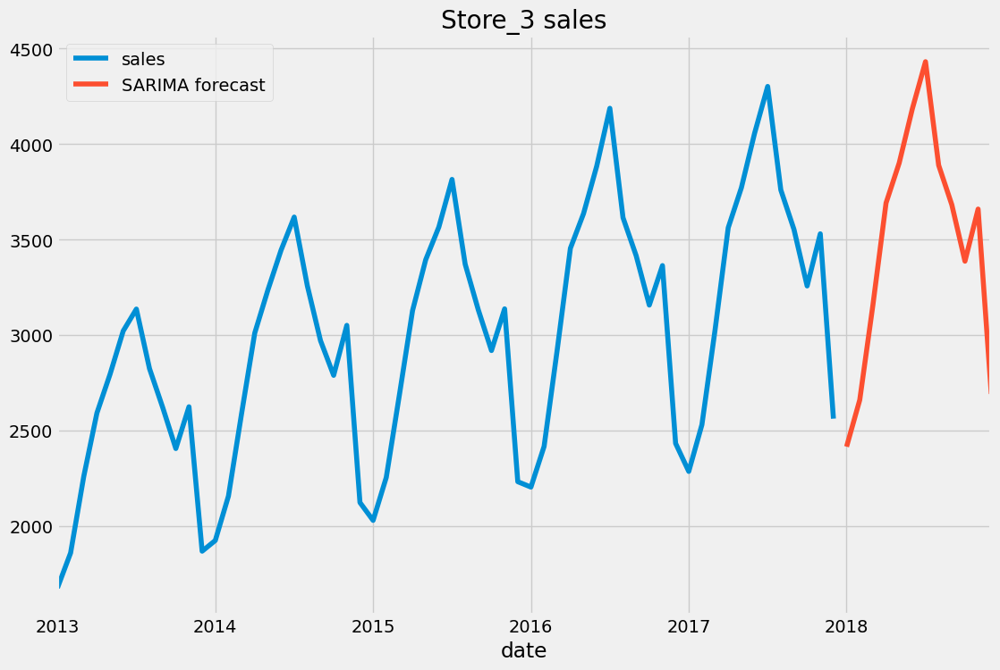

In [158]:
store3_m.plot(legend=True,figsize=(12,8))
forecast_store3.plot(legend=True)
plt.title("Store_3 sales")

### Store 3 forecasted sales for year 2018

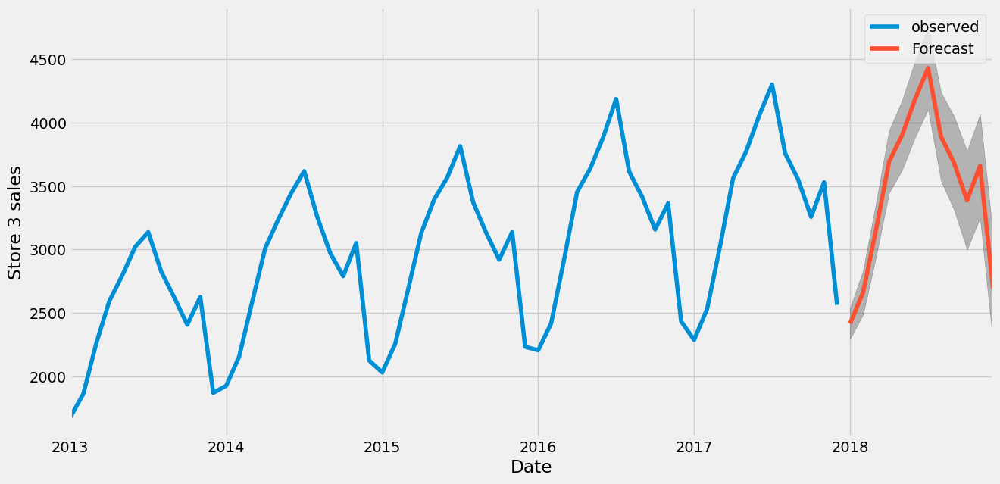

In [159]:
pred_store3 = result_store3_final.get_forecast(steps=12)
pred_ci_store3 = pred_store3.conf_int()
ax = store3_m.plot(label='observed',figsize=(14,7))
pred_store3.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store3.index,
               pred_ci_store3.iloc[:,0],
               pred_ci_store3.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 3 sales')
plt.legend()
plt.show()

## Store 4-10

In [160]:
#spliting train and test


train_store4_m = store4_m.iloc[:48]
test_store4_m = store4_m.iloc[48:]
model_store4= auto_arima(store4_m,m=12,seasonal=True,trace=True)

train_store5_m = store5_m.iloc[:48]
test_store5_m = store5_m.iloc[48:]
model_store5= auto_arima(store5_m,m=12,seasonal=True,trace=True)


train_store6_m = store6_m.iloc[:48]
test_store6_m = store6_m.iloc[48:]
model_store6= auto_arima(store6_m,m=12,seasonal=True,trace=True)

train_store7_m = store7_m.iloc[:48]
test_store7_m = store7_m.iloc[48:]
model_store7= auto_arima(store7_m,m=12,seasonal=True,trace=True)

train_store8_m = store8_m.iloc[:48]
test_store8_m = store8_m.iloc[48:]
model_store8= auto_arima(store8_m,m=12,seasonal=True,trace=True)

train_store9_m = store9_m.iloc[:48]
test_store9_m = store9_m.iloc[48:]
model_store9= auto_arima(store9_m,m=12,seasonal=True,trace=True)


train_store10_m = store10_m.iloc[:48]
test_store10_m = store10_m.iloc[48:]
model_store10= auto_arima(store10_m,m=12,seasonal=True,trace=True)



Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=514.977, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=518.399, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=518.493, Time=0.06 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=516.724, Time=0.10 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=516.826, Time=0.11 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=516.679, Time=0.03 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=516.648, Time=0.03 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=518.629, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=516.853, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 1.734 seconds
Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=490.979, Time

In [161]:
model_store4.summary()

model_store5.summary()

model_store6.summary()

model_store7.summary()

model_store8.summary()

model_store9.summary()

model_store10.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                   60
Model:             SARIMAX(0, 1, 1)x(2, 1, [], 12)   Log Likelihood                -260.605
Date:                             Mon, 20 Feb 2023   AIC                            529.209
Time:                                     10:26:16   BIC                            536.610
Sample:                                 01-01-2013   HQIC                           531.994
                                      - 12-01-2017                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3079      0.133     -2.309      0.021      -0.569      -0.047
ar.S.L12      -0.1159      0.129     -0.896      0.370      -0.369       0.138
ar.S.L24       0.4948      0.183      2.705      0.007       0.136       0.853
sigma2      3256.6905    854.089      3.813      0.000    1582.707    4930.673
===================================================================================
Ljung-Box (L1) (Q):                   0.11   Jarque-Bera (JB):                 4.73
Prob(Q):                              0.74   Prob(JB):                         0.09
Heteroskedasticity (H):               0.47   Skew:                            -0.77
Prob(H) (two-sided):                  0.14   Kurtosis:                         3.12
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [162]:
model_store4 = SARIMAX(train_store4_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store4 = model_store4.fit()
result_store4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -192.649
Date:                            Mon, 20 Feb 2023   AIC                            387.299
Time:                                    10:26:16   BIC                            388.854
Sample:                                01-01-2013   HQIC                           387.835
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3535.4352    682.162      5.183      0.000    2198.422    4872.448
===================================================================================
Ljung-Box (L1) (Q):                   0.43   Jarque-Bera (JB):                 6.87
Prob(Q):                              0.51   Prob(JB):                         0.03
Heteroskedasticity (H):               0.97   Skew:                            -0.98
Prob(H) (two-sided):                  0.95   Kurtosis:                         3.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [163]:
model_store5 = SARIMAX(train_store5_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store5 = model_store5.fit()
result_store5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -182.800
Date:                            Mon, 20 Feb 2023   AIC                            367.600
Time:                                    10:26:16   BIC                            369.155
Sample:                                01-01-2013   HQIC                           368.137
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2013.8085    461.768      4.361      0.000    1108.760    2918.857
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 2.44
Prob(Q):                              0.86   Prob(JB):                         0.29
Heteroskedasticity (H):               0.51   Skew:                            -0.65
Prob(H) (two-sided):                  0.26   Kurtosis:                         3.11
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [164]:
model_store6 = SARIMAX(train_store6_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store6 = model_store6.fit()
result_store6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -184.100
Date:                            Mon, 20 Feb 2023   AIC                            370.199
Time:                                    10:26:16   BIC                            371.755
Sample:                                01-01-2013   HQIC                           370.736
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2169.0565    460.835      4.707      0.000    1265.837    3072.276
===================================================================================
Ljung-Box (L1) (Q):                   0.78   Jarque-Bera (JB):                 2.41
Prob(Q):                              0.38   Prob(JB):                         0.30
Heteroskedasticity (H):               0.79   Skew:                            -0.60
Prob(H) (two-sided):                  0.70   Kurtosis:                         3.48
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [165]:
model_store7 = SARIMAX(train_store7_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store7 = model_store7.fit()
result_store7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -179.208
Date:                            Mon, 20 Feb 2023   AIC                            360.416
Time:                                    10:26:16   BIC                            361.971
Sample:                                01-01-2013   HQIC                           360.952
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1640.1129    335.378      4.890      0.000     982.784    2297.442
===================================================================================
Ljung-Box (L1) (Q):                   0.23   Jarque-Bera (JB):                 6.89
Prob(Q):                              0.63   Prob(JB):                         0.03
Heteroskedasticity (H):               0.67   Skew:                            -1.05
Prob(H) (two-sided):                  0.49   Kurtosis:                         3.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [166]:
model_store8 = SARIMAX(train_store8_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store8 = model_store8.fit()
result_store8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -198.539
Date:                            Mon, 20 Feb 2023   AIC                            399.077
Time:                                    10:26:16   BIC                            400.633
Sample:                                01-01-2013   HQIC                           399.614
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      4949.8984   1075.899      4.601      0.000    2841.175    7058.621
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 3.42
Prob(Q):                              0.92   Prob(JB):                         0.18
Heteroskedasticity (H):               0.60   Skew:                            -0.74
Prob(H) (two-sided):                  0.39   Kurtosis:                         3.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [167]:
model_store9 = SARIMAX(train_store9_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store9 = model_store9.fit()
result_store9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -193.073
Date:                            Mon, 20 Feb 2023   AIC                            388.146
Time:                                    10:26:16   BIC                            389.701
Sample:                                01-01-2013   HQIC                           388.682
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3622.0376    854.104      4.241      0.000    1948.025    5296.051
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 2.02
Prob(Q):                              0.88   Prob(JB):                         0.36
Heteroskedasticity (H):               0.80   Skew:                            -0.59
Prob(H) (two-sided):                  0.70   Kurtosis:                         2.97
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [168]:
model_store10 = SARIMAX(train_store10_m,order=(0, 1, 1),seasonal_order=(2, 1, 0, 12),enforce_invertibility=False)
result_store10 = model_store9.fit()
result_store10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                              sales   No. Observations:                   48
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -193.073
Date:                            Mon, 20 Feb 2023   AIC                            388.146
Time:                                    10:26:16   BIC                            389.701
Sample:                                01-01-2013   HQIC                           388.682
                                     - 12-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3622.0376    854.104      4.241      0.000    1948.025    5296.051
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 2.02
Prob(Q):                              0.88   Prob(JB):                         0.36
Heteroskedasticity (H):               0.80   Skew:                            -0.59
Prob(H) (two-sided):                  0.70   Kurtosis:                         2.97
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

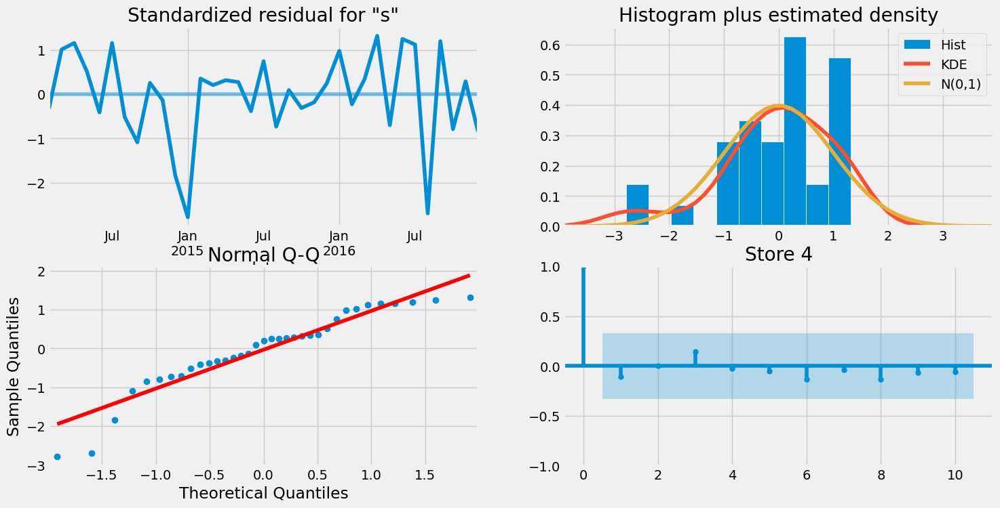

In [169]:
result_store4.plot_diagnostics(figsize=(16,8))
plt.title('Store 4')
plt.show()

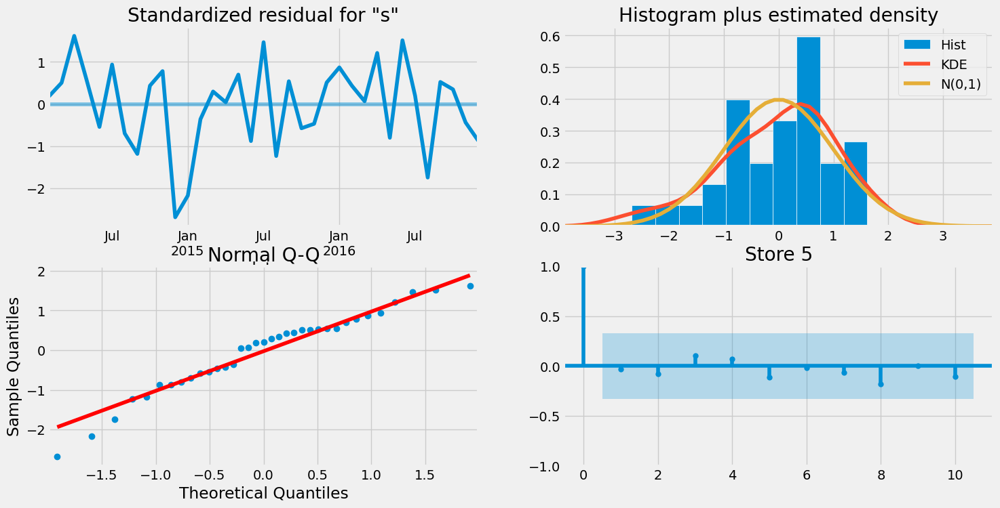

In [170]:
result_store5.plot_diagnostics(figsize=(16,8))
plt.title('Store 5')
plt.show()

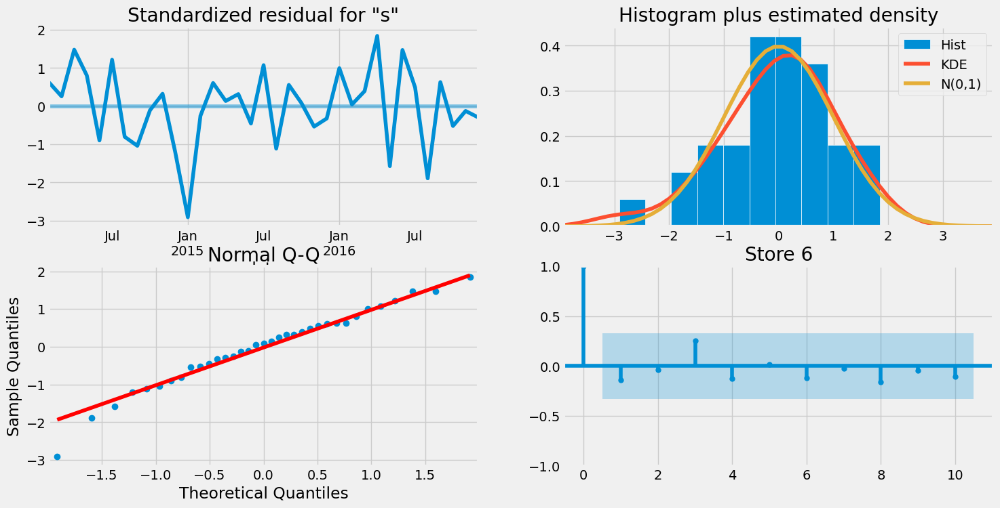

In [171]:
result_store6.plot_diagnostics(figsize=(16,8))
plt.title('Store 6')
plt.show()

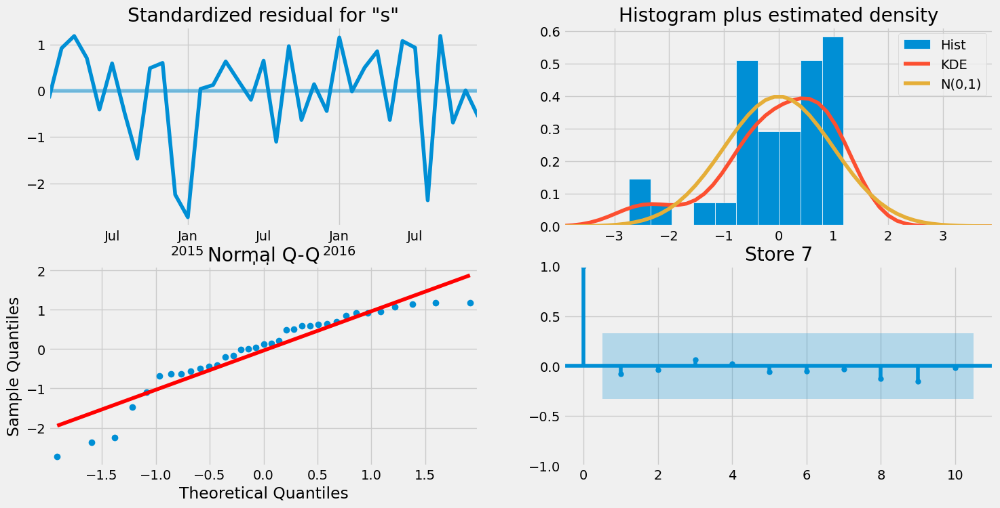

In [172]:
result_store7.plot_diagnostics(figsize=(16,8))
plt.title('Store 7')
plt.show()

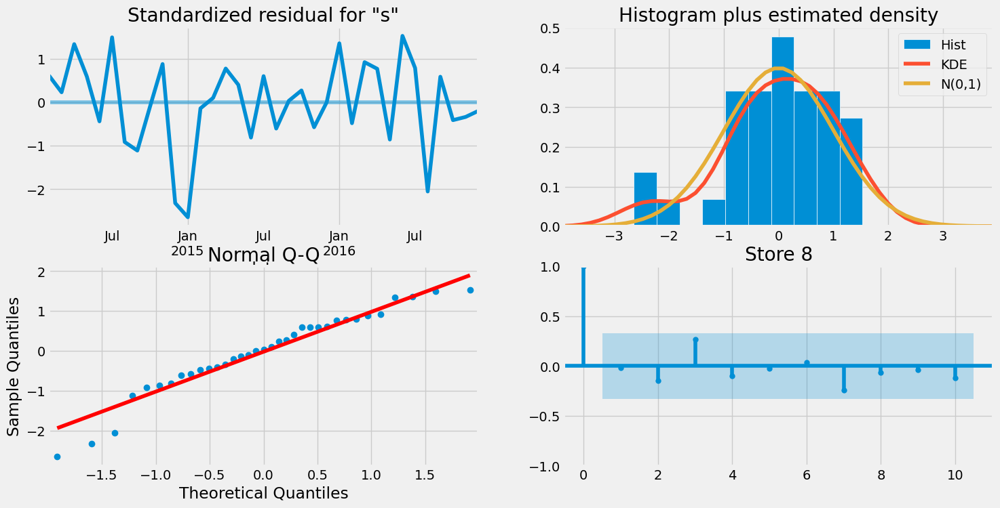

In [173]:
result_store8.plot_diagnostics(figsize=(16,8))
plt.title('Store 8')
plt.show()

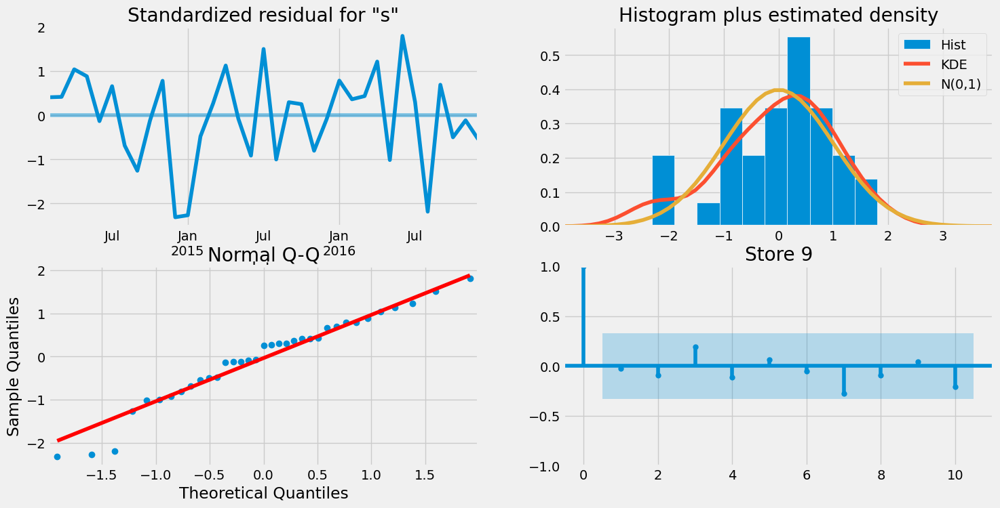

In [174]:
result_store9.plot_diagnostics(figsize=(16,8))
plt.title('Store 9')
plt.show()

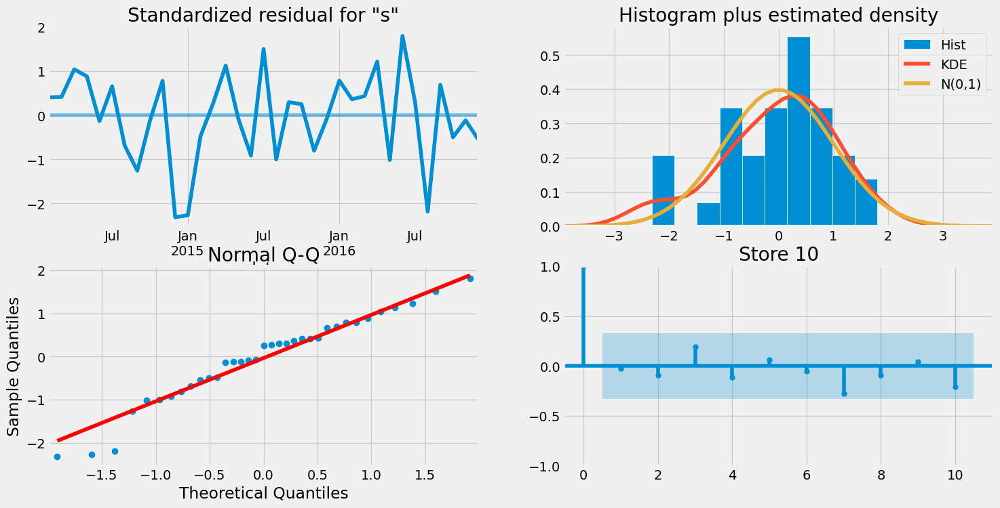

In [175]:
result_store10.plot_diagnostics(figsize=(16,8))
plt.title('Store 10')
plt.show()

### Now lets predict  the future values

In [176]:
start = len(train_store4_m)
end = len(train_store4_m) + len(test_store4_m) - 1
prediction_store4 =result_store4.predict(start,end).rename('SARIMA model predictions')
prediction_store4.head()

start = len(train_store5_m)
end = len(train_store5_m) + len(test_store5_m) - 1
prediction_store5 =result_store5.predict(start,end).rename('SARIMA model predictions')
prediction_store5.head()

start = len(train_store6_m)
end = len(train_store6_m) + len(test_store6_m) - 1
prediction_store6 =result_store6.predict(start,end).rename('SARIMA model predictions')
prediction_store6.head()

start = len(train_store7_m)
end = len(train_store7_m) + len(test_store7_m) - 1
prediction_store7 =result_store7.predict(start,end).rename('SARIMA model predictions')
prediction_store7.head()

start = len(train_store8_m)
end = len(train_store8_m) + len(test_store8_m) - 1
prediction_store8 =result_store8.predict(start,end).rename('SARIMA model predictions')
prediction_store8.head()

start = len(train_store9_m)
end = len(train_store9_m) + len(test_store9_m) - 1
prediction_store9 =result_store9.predict(start,end).rename('SARIMA model predictions')
prediction_store9.head()

start = len(train_store10_m)
end = len(train_store10_m) + len(test_store10_m) - 1
prediction_store10 =result_store10.predict(start,end).rename('SARIMA model predictions')
prediction_store10.head()



2017-01-01    2210.903226
2017-02-01    2413.764182
2017-03-01    2856.774194
2017-04-01    3357.419355
2017-05-01    3535.903226
Freq: MS, Name: SARIMA model predictions, dtype: float64

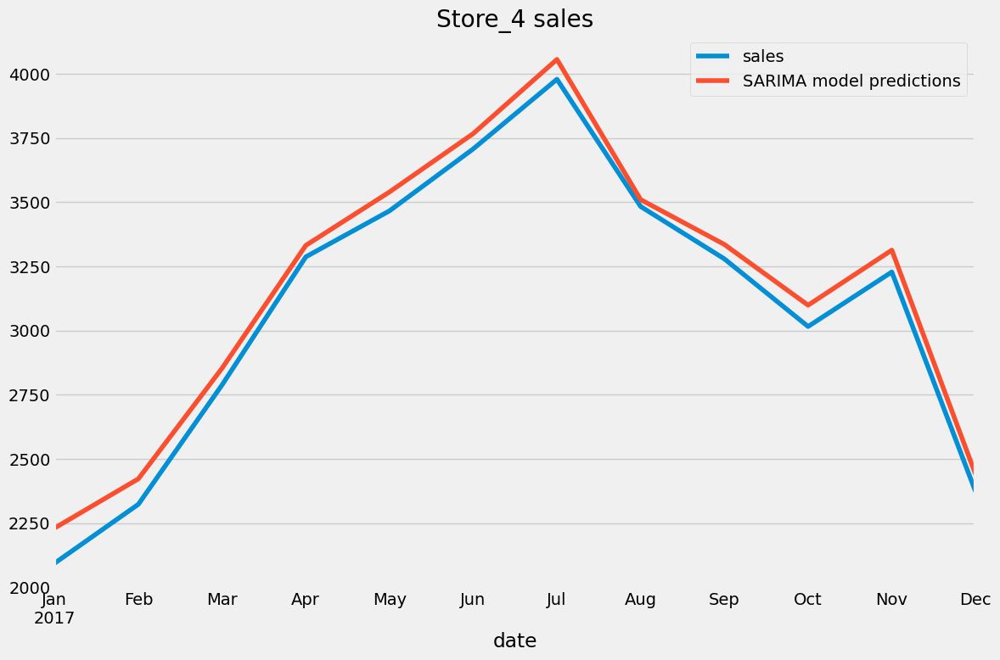

In [212]:
test_store4_m.plot(figsize=(12,8),legend=True)
prediction_store4.plot(legend=True)
plt.title("Store_4 sales")
plt.tight_layout()



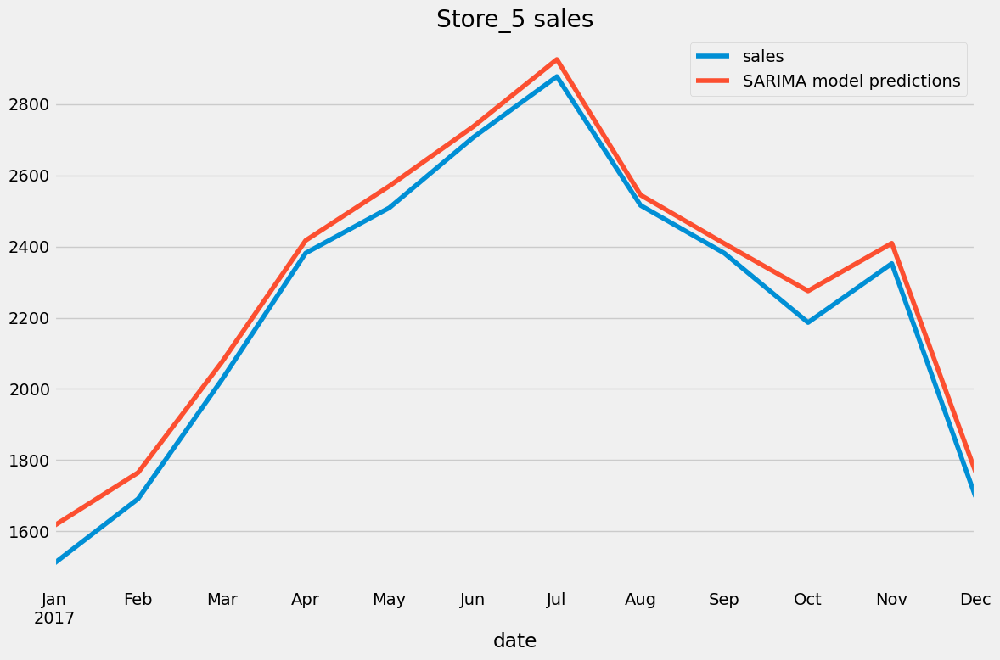

In [211]:
test_store5_m.plot(figsize=(12,8),legend=True)
prediction_store5.plot(legend=True)
plt.title("Store_5 sales")
plt.tight_layout()

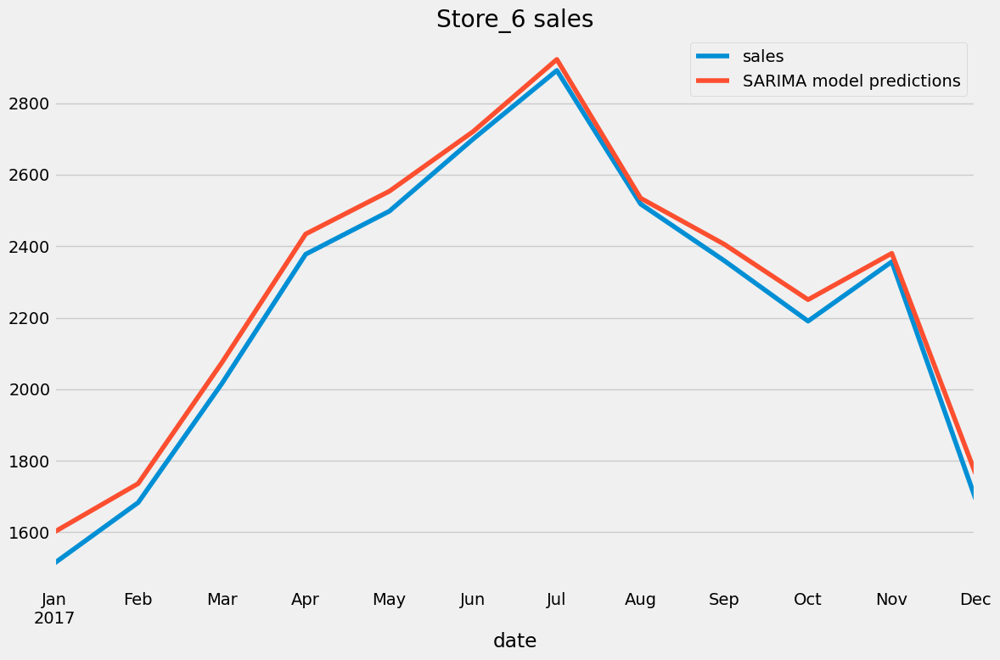

In [178]:
test_store6_m.plot(figsize=(12,8),legend=True)
prediction_store6.plot(legend=True)
plt.title("Store_6 sales")
plt.tight_layout()

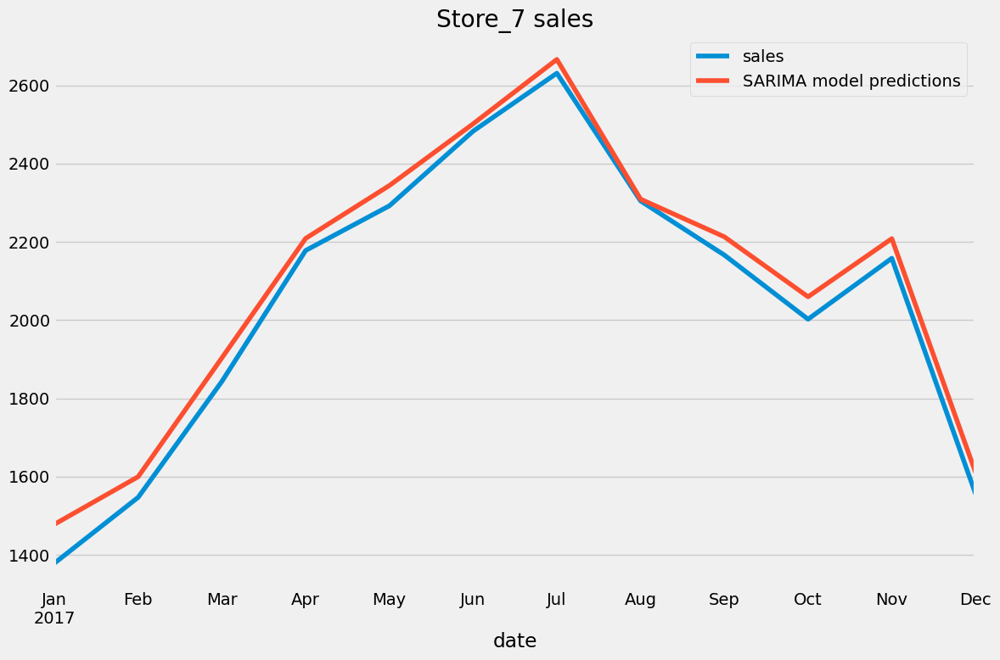

In [179]:
test_store7_m.plot(figsize=(12,8),legend=True)
prediction_store7.plot(legend=True)
plt.title("Store_7 sales")
plt.tight_layout()

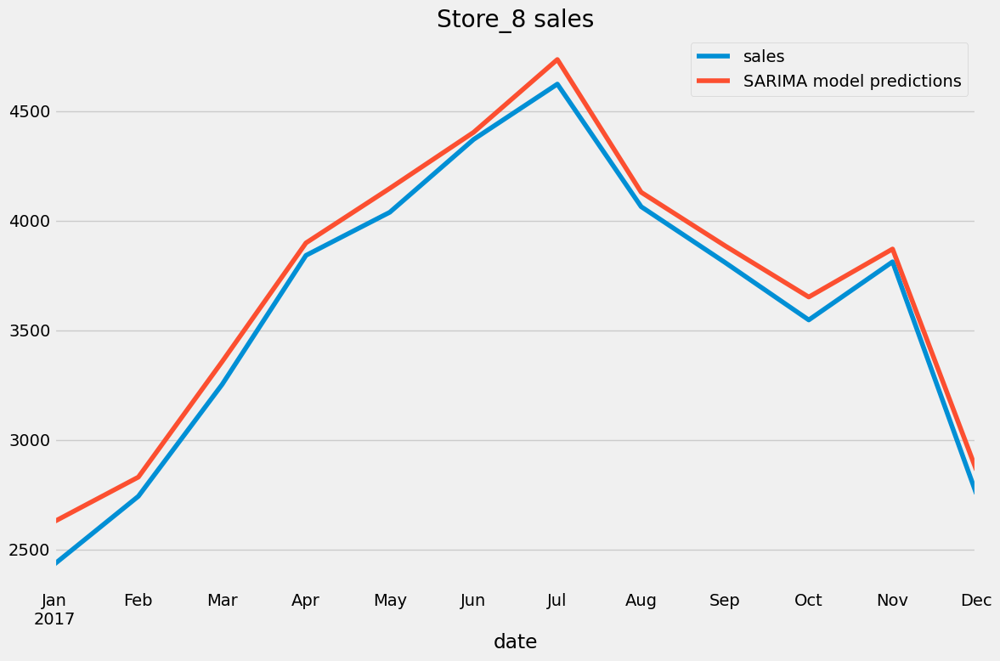

In [180]:
test_store8_m.plot(figsize=(12,8),legend=True)
prediction_store8.plot(legend=True)
plt.title("Store_8 sales")
plt.tight_layout()

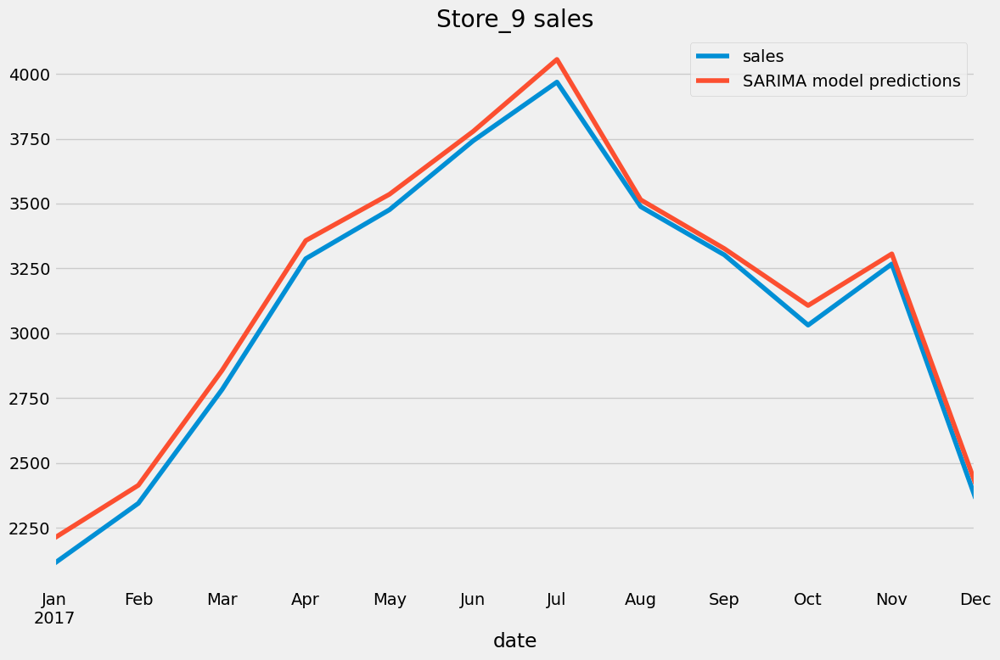

In [181]:
test_store9_m.plot(figsize=(12,8),legend=True)
prediction_store9.plot(legend=True)
plt.title("Store_9 sales")
plt.tight_layout()

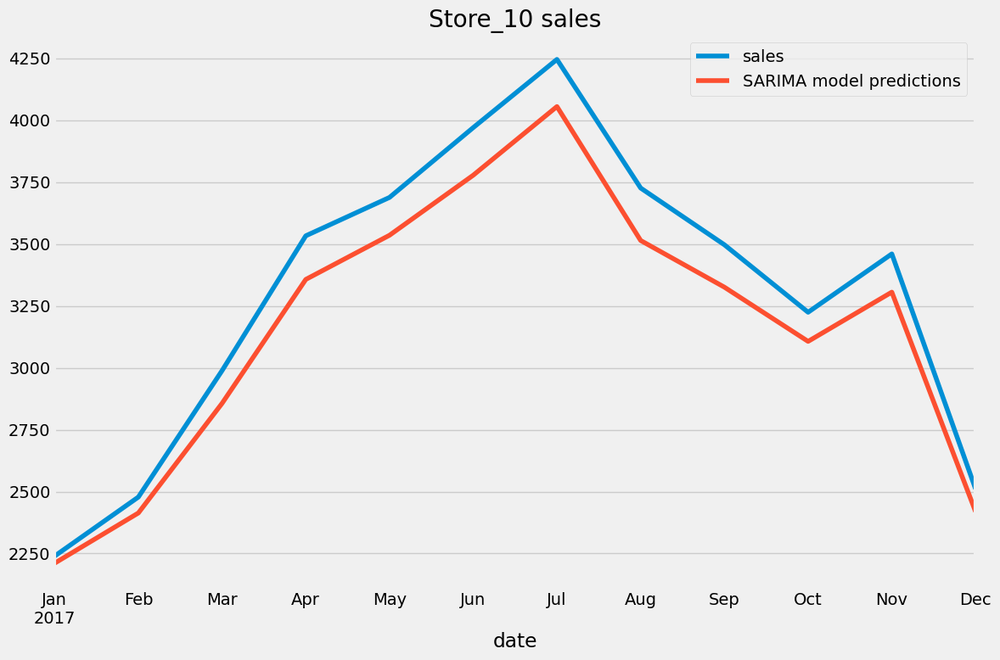

In [182]:
test_store10_m.plot(figsize=(12,8),legend=True)
prediction_store10.plot(legend=True)
plt.title("Store_10 sales")
plt.tight_layout()

### Evaluation model

In [183]:
mean_squared_error_4=mean_squared_error(test_store4_m,prediction_store4)
rmse_4=rmse(test_store4_m,prediction_store4)
mean_4=test_store4_m.mean()
print("mean squared error of store 4 ",mean_squared_error_4)
print("rmse of store 4 ",rmse_4)
print("test mean of store 4 ",mean_4)
print("**************************************************************")

mean_squared_error_5=mean_squared_error(test_store5_m,prediction_store5)
rmse_5=rmse(test_store5_m,prediction_store5)
mean_5=test_store5_m.mean()
print("mean squared error of store 5 ",mean_squared_error_5)
print("rmse of store 5 ",rmse_5)
print("test mean of store 5 ",mean_5)
print("**************************************************************")

mean_squared_error_6=mean_squared_error(test_store6_m,prediction_store6)
rmse_6=rmse(test_store6_m,prediction_store6)
mean_6=test_store6_m.mean()
print("mean squared error of store 6 ",mean_squared_error_6)
print("rmse of store 6 ",rmse_6)
print("test mean of store 6 ",mean_6)
print("**************************************************************")

mean_squared_error_7=mean_squared_error(test_store7_m,prediction_store7)
rmse_7=rmse(test_store7_m,prediction_store7)
mean_7=test_store7_m.mean()
print("mean squared error of store 7 ",mean_squared_error_7)
print("rmse of store 7 ",rmse_7)
print("test mean of store 7 ",mean_7)
print("**************************************************************")


mean_squared_error_8=mean_squared_error(test_store8_m,prediction_store8)
rmse_8=rmse(test_store8_m,prediction_store8)
mean_8=test_store8_m.mean()
print("mean squared error of store 8 ",mean_squared_error_8)
print("rmse of store 8 ",rmse_8)
print("test mean of store 5 ",mean_8)
print("**************************************************************")

mean_squared_error_9=mean_squared_error(test_store9_m,prediction_store9)
rmse_9=rmse(test_store9_m,prediction_store9)
mean_9=test_store9_m.mean()
print("mean squared error of store 9 ",mean_squared_error_6)
print("rmse of store 9 ",rmse_9)
print("test mean of store 9 ",mean_9)
print("**************************************************************")

mean_squared_error_10=mean_squared_error(test_store10_m,prediction_store10)
rmse_10=rmse(test_store10_m,prediction_store10)
mean_10=test_store10_m.mean()
print("mean squared error of store 10 ",mean_squared_error_10)
print("rmse of store 10 ",rmse_10)
print("test mean of store 10 ",mean_10)

mean squared error of store 4  6013.894987166066
rmse of store 4  77.54930681293074
test mean of store 4  3085.8208973374294
**************************************************************
mean squared error of store 5  3740.843629212619
rmse of store 5  61.16243642312346
test mean of store 5  2236.3349014336914
**************************************************************
mean squared error of store 6  2757.0382109765906
rmse of store 6  52.507506234600314
test mean of store 6  2233.0886712749616
**************************************************************
mean squared error of store 7  2707.735588867497
rmse of store 7  52.03590672667766
test mean of store 7  2045.1242959549409
**************************************************************
mean squared error of store 8  10099.18865014124
rmse of store 8  100.49471951371991
test mean of store 5  3607.3589157706097
**************************************************************
mean squared error of store 9  2757.0382109765906
rmse of

### Now let us forecast  future values

In [213]:
model_store4_final = SARIMAX(store4_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store4_final = model_store4_final.fit()
forecast_store4 = result_store4_final.predict(len(store4_m),len(store4_m)+11,typ='levels').rename('SARIMA forecast')

model_store5_final = SARIMAX(store5_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store5_final = model_store5_final.fit()
forecast_store5 = result_store5_final.predict(len(store5_m),len(store5_m)+11,typ='levels').rename('SARIMA forecast')

model_store6_final = SARIMAX(store6_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store6_final = model_store6_final.fit()
forecast_store6 = result_store6_final.predict(len(store6_m),len(store6_m)+11,typ='levels').rename('SARIMA forecast')

model_store7_final = SARIMAX(store7_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store7_final = model_store7_final.fit()
forecast_store7 = result_store7_final.predict(len(store7_m),len(store7_m)+11,typ='levels').rename('SARIMA forecast')

model_store8_final = SARIMAX(store8_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store8_final = model_store8_final.fit()
forecast_store8 = result_store8_final.predict(len(store8_m),len(store8_m)+11,typ='levels').rename('SARIMA forecast')

model_store9_final = SARIMAX(store9_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store9_final = model_store9_final.fit()
forecast_store9 = result_store9_final.predict(len(store9_m),len(store9_m)+11,typ='levels').rename('SARIMA forecast')


model_store10_final = SARIMAX(store10_m,order=(0, 1, 0),seasonal_order=(0, 1, 0, 12),enforce_invertibility=False)
result_store10_final = model_store10_final.fit()
forecast_store10 = result_store10_final.predict(len(store10_m),len(store10_m)+11,typ='levels').rename('SARIMA forecast')


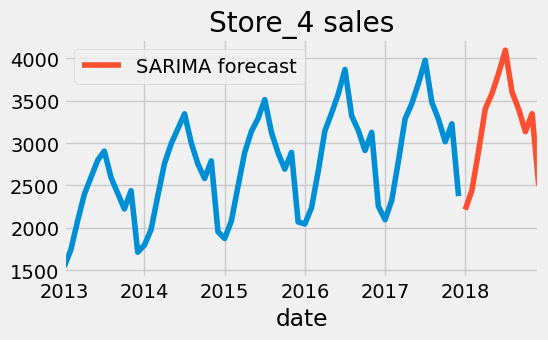

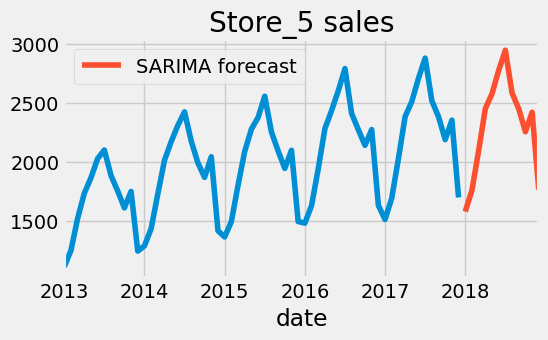

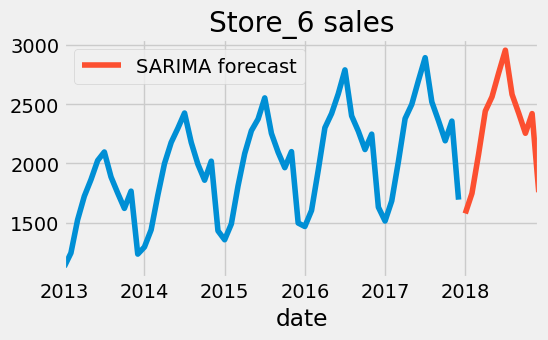

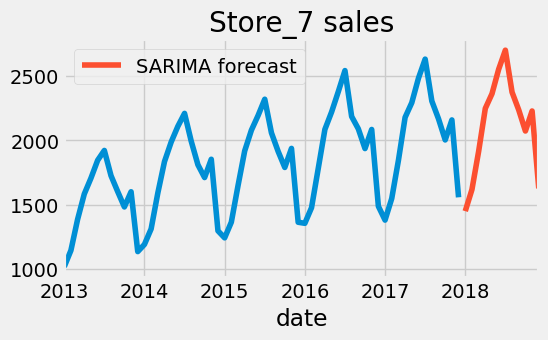

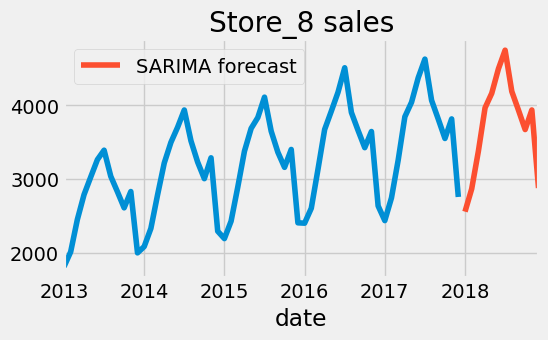

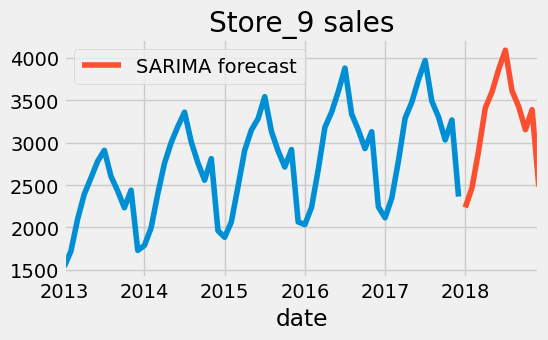

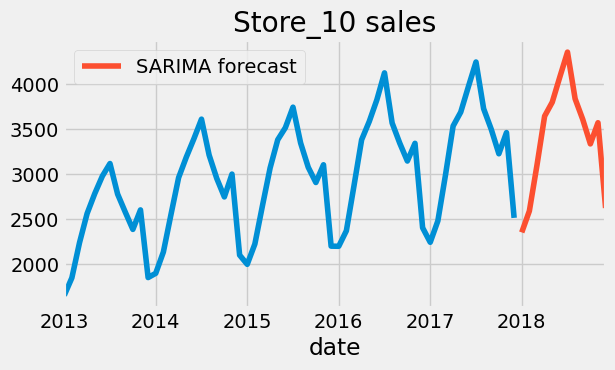

In [221]:
plt.figure(figsize=(12,10))
plt.subplot(3,2,1)
store4_m.plot()
forecast_store4.plot(legend=True)
plt.title("Store_4 sales")

plt.figure(figsize=(12,10))
plt.subplot(3,2,2)
store5_m.plot()
forecast_store5.plot(legend=True)
plt.title("Store_5 sales")

plt.figure(figsize=(12,10))
plt.subplot(3,2,3)
store6_m.plot()
forecast_store6.plot(legend=True)
plt.title("Store_6 sales")

plt.figure(figsize=(12,10))
plt.subplot(3,2,4)
store7_m.plot()
forecast_store7.plot(legend=True)
plt.title("Store_7 sales")

plt.figure(figsize=(12,10))
plt.subplot(3,2,5)
store8_m.plot()
forecast_store8.plot(legend=True)
plt.title("Store_8 sales")

plt.figure(figsize=(12,10))
plt.subplot(3,2,6)
store9_m.plot()
forecast_store9.plot(legend=True)
plt.title("Store_9 sales")

plt.figure(figsize=(12,10))
plt.subplot(3,2,6)
store10_m.plot()
forecast_store10.plot(legend=True)
plt.title("Store_10 sales")

plt.tight_layout()


plt.figure(figsize=(12,10))
plt.subplot(3,2,1)
store4_m.plot(legend=True,figsize=(12,8))
forecast_store4.plot(legend=True)
plt.title("Store_4 sales")

store5_m.plot(legend=True,figsize=(12,8))
forecast_store5.plot(legend=True)
plt.title("Store_5 sales")

store6_m.plot(legend=True,figsize=(12,8))
forecast_store6.plot(legend=True)
plt.title("Store_6 sales")

store7_m.plot(legend=True,figsize=(12,8))
forecast_store7.plot(legend=True)
plt.title("Store_7 sales")

store8_m.plot(legend=True,figsize=(12,8))
forecast_store8.plot(legend=True)
plt.title("Store_8 sales")

store9_m.plot(legend=True,figsize=(12,8))
forecast_store9.plot(legend=True)
plt.title("Store_9 sales")

store10_m.plot(legend=True,figsize=(12,8))
forecast_store10.plot(legend=True)
plt.title("Store_10 sales")


### Stores forecasted sales for year 2018

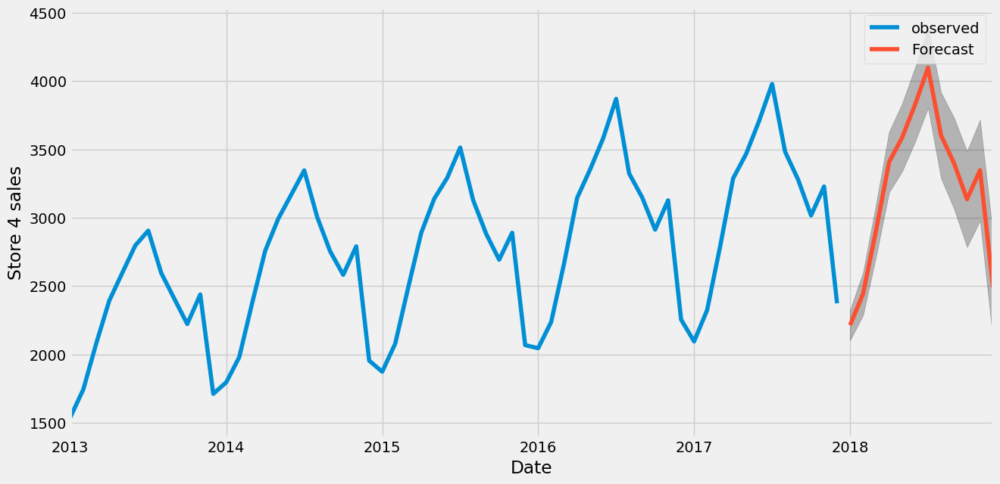

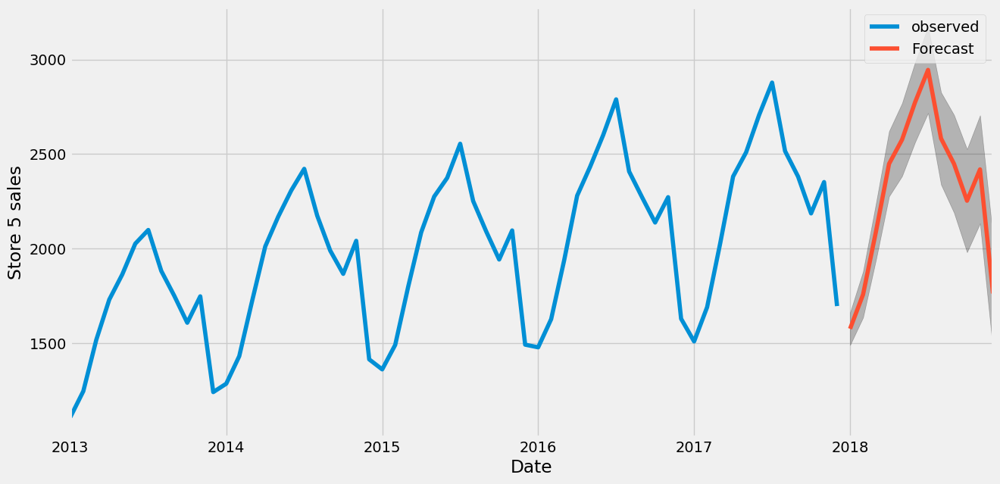

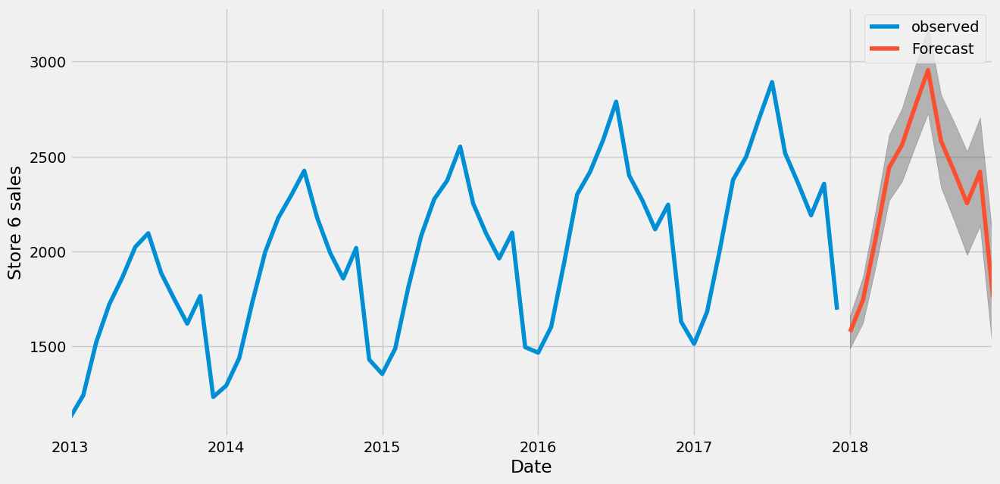

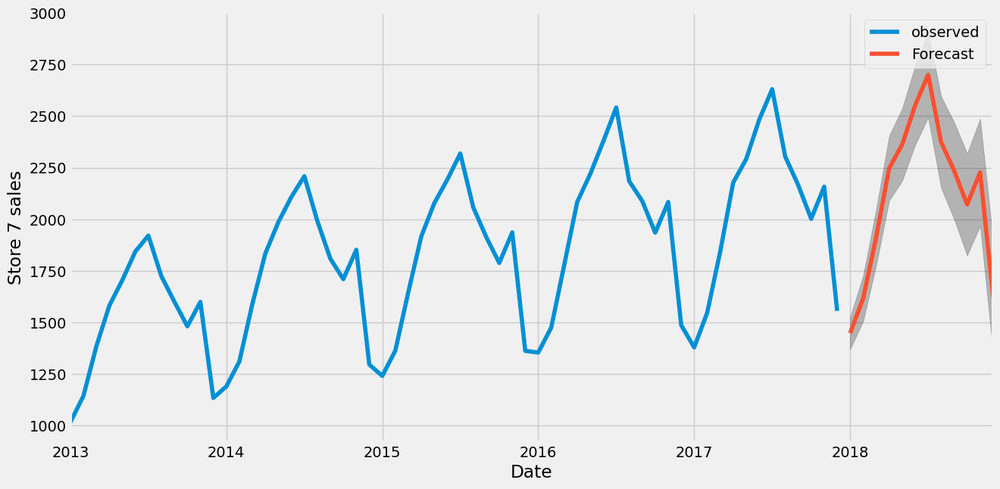

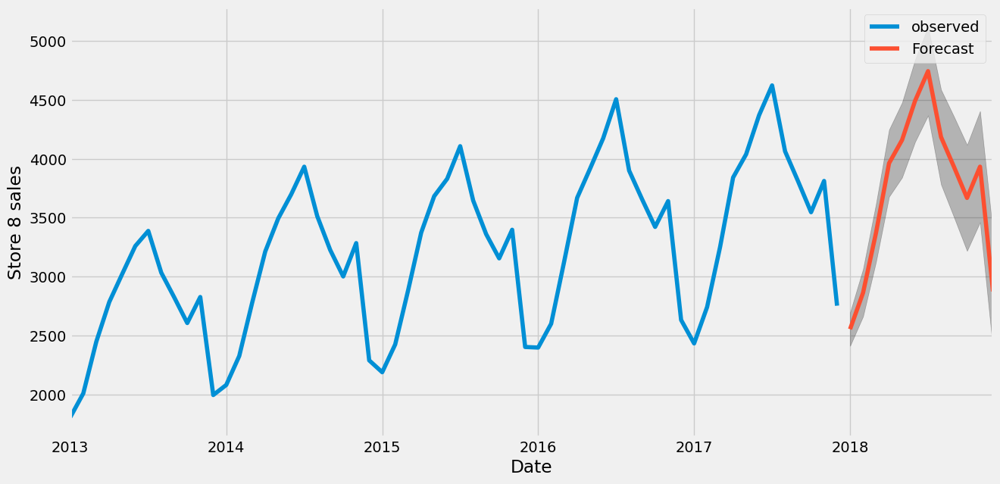

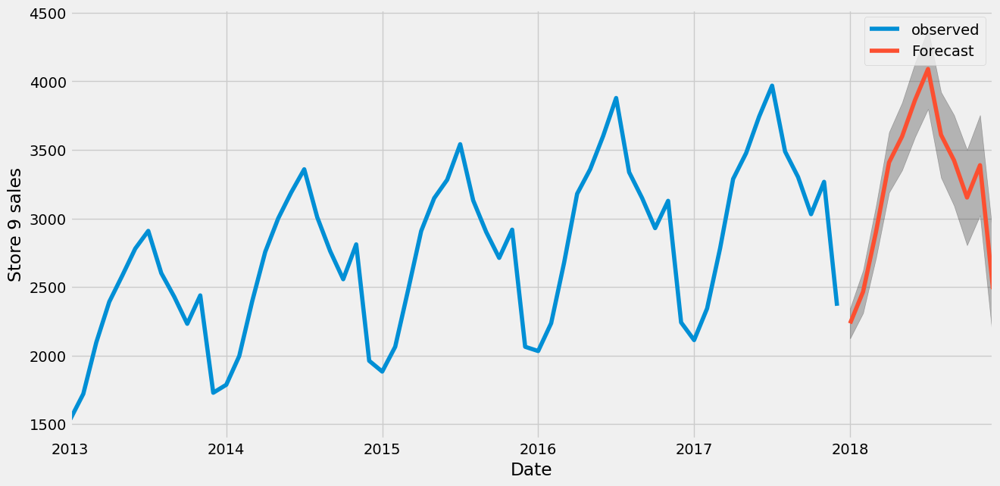

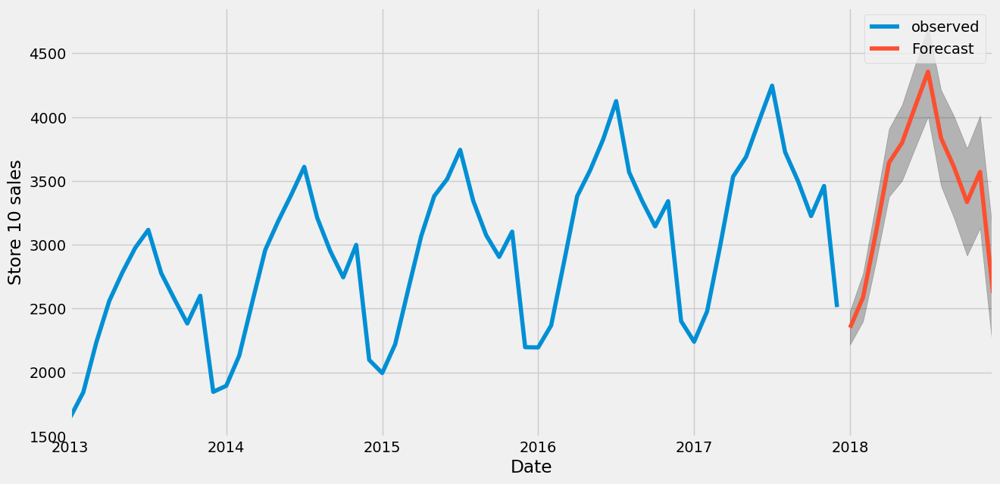

In [222]:
pred_store4 = result_store4_final.get_forecast(steps=12)
pred_ci_store4 = pred_store4.conf_int()
ax = store4_m.plot(label='observed',figsize=(14,7))
pred_store4.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store4.index,
               pred_ci_store4.iloc[:,0],
               pred_ci_store4.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 4 sales')
plt.legend()
plt.show()

pred_store5 = result_store5_final.get_forecast(steps=12)
pred_ci_store5 = pred_store5.conf_int()
ax = store5_m.plot(label='observed',figsize=(14,7))
pred_store5.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store5.index,
               pred_ci_store5.iloc[:,0],
               pred_ci_store5.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 5 sales')
plt.legend()
plt.show()

pred_store6 = result_store6_final.get_forecast(steps=12)
pred_ci_store6 = pred_store6.conf_int()
ax = store6_m.plot(label='observed',figsize=(14,7))
pred_store6.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store6.index,
               pred_ci_store6.iloc[:,0],
               pred_ci_store6.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 6 sales')
plt.legend()
plt.show()

pred_store7 = result_store7_final.get_forecast(steps=12)
pred_ci_store7 = pred_store7.conf_int()
ax = store7_m.plot(label='observed',figsize=(14,7))
pred_store7.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store7.index,
               pred_ci_store7.iloc[:,0],
               pred_ci_store7.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 7 sales')
plt.legend()
plt.show()

pred_store8 = result_store8_final.get_forecast(steps=12)
pred_ci_store8 = pred_store8.conf_int()
ax = store8_m.plot(label='observed',figsize=(14,7))
pred_store8.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store8.index,
               pred_ci_store8.iloc[:,0],
               pred_ci_store8.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 8 sales')
plt.legend()
plt.show()

pred_store9 = result_store9_final.get_forecast(steps=12)
pred_ci_store9 = pred_store9.conf_int()
ax = store9_m.plot(label='observed',figsize=(14,7))
pred_store9.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store9.index,
               pred_ci_store9.iloc[:,0],
               pred_ci_store9.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 9 sales')
plt.legend()
plt.show()

pred_store10 = result_store10_final.get_forecast(steps=12)
pred_ci_store10 = pred_store10.conf_int()
ax = store10_m.plot(label='observed',figsize=(14,7))
pred_store10.predicted_mean.plot(ax=ax,label='Forecast')
ax.fill_between(pred_ci_store10.index,
               pred_ci_store10.iloc[:,0],
               pred_ci_store10.iloc[:,1],color='k',alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Store 10 sales')
plt.legend()
plt.show()

